# Training notebook for some audio classification

## Using PANN SED model

See: 
* PANN source https://github.com/qiuqiangkong/audioset_tagging_cnn/

* https://github.com/FaithKaixuan/German_Birdcall_Classification_PANNs_CNNseries/blob/master/Results%20Analysis/Germany_Birdcall_Engine_nonemixup.ipynb

* Usage Example https://github.com/yinkalario/Sound-Event-Detection-AudioSet

Other option not explored
* https://www.kaggle.com/hidehisaarai1213/introduction-to-sound-event-detection/comments#962915

Adding coyote data

### Docs

https://fastaudio.github.io/

https://github.com/musikalkemist/pytorchforaudio

* Use some Sound Event Detection - polyphonic
* Use image transformers - see guy at Kaggle bird competition
* Use multiple networks at different time scales and combine results
* Recurrent/transformer?
* change background noises
* use stereo signals to help - phase info
* Time of Day?
* Use wavelets

* Change validation so that it makes a class decision based on the whole validation sample, not just the 5 sec clip.

* I added 0.25 of class for "no_call" to each training data point to help with training.

* take out the 'interpolation' and 'padding' of framewise output.  It just increases data size without any value.  Add the timestamp to the output here instead.  

https://pywavelets.readthedocs.io/en/latest/index.html

https://pytorch-wavelets.readthedocs.io/en/latest/readme.html
https://www.researchgate.net/publication/242415506_BIRD_SOUND_CLASSIFICATION_AND_RECOGNITION_USING_WAVELETS_KLASIFIKACIJA_IN_PREPOZNAVANJE_PTIOEJIH_GLASOV_S_POMOOEJO_VALOEKOV

https://ataspinar.com/2018/12/21/a-guide-for-using-the-wavelet-transform-in-machine-learning/

https://github.com/tomrunia/PyTorchWavelets  - 1D wavelets in pytorch


* Related problem - human activity recognition https://machinelearningmastery.com/deep-learning-models-for-human-activity-recognition/




## Project setup

In [1]:
from pathlib import Path
import os

project_base = "/media/SSD/Sound Detection/"
results_folder = "Results"
data_folder = "birdclef-2021/train_short_audio"
model_folder = "models"

model_name_base = "pann-test-other"

In [2]:
data_path = Path(project_base)
print(data_path)

/media/SSD/Sound Detection


### Experiment documentation

In [3]:
%%javascript
var nb = IPython.notebook;
var kernel = IPython.notebook.kernel;
var command = "NOTEBOOK_FULL_PATH = '" + nb.base_url + nb.notebook_path + "'";
kernel.execute(command);



<IPython.core.display.Javascript object>

In [4]:
print("NOTEBOOK_FULL_PATH:\n", NOTEBOOK_FULL_PATH)

NOTEBOOK_FULL_PATH:
 /Sound/Training-PANN-SED-1A w other animals.ipynb


In [5]:
nb_path = Path(NOTEBOOK_FULL_PATH)
print(nb_path)

# Make result folder if it does not exist
result_path = Path(project_base, results_folder, nb_path.stem)
print(result_path)
os.makedirs(result_path, exist_ok=True)

/Sound/Training-PANN-SED-1A w other animals.ipynb
/media/SSD/Sound Detection/Results/Training-PANN-SED-1A w other animals


In [6]:
model_out_path = Path(project_base) / model_folder
print(model_out_path)
os.makedirs(model_out_path, exist_ok=True)

/media/SSD/Sound Detection/models


In [7]:
#!wget -P "/media/SSD/Sound Detection/models" https://zenodo.org/record/3987831/files/Cnn14_DecisionLevelAtt_mAP%3D0.425.pth?download=1

## Start here

In [8]:
#Improved CUDA debugging
#os.environ['CUDA_LAUNCH_BLOCKING'] = "1"

In [9]:
import torch


In [10]:
t = torch.cuda.get_device_properties(0).total_memory
r = torch.cuda.memory_reserved(0)
a = torch.cuda.memory_allocated(0)
f = r-a  # free inside reserved

print("total=",t)
print("reserved=",r)
print("allocated=",a)
print("free=",f)

total= 8361672704
reserved= 0
allocated= 0
free= 0


In [11]:

import pandas as pd
import torchaudio
import numpy as np

Ideas
* Convert dataframe into sqlite in memory database for faster training
* Convert dataframe to numpy array for faster training


In [12]:
# from https://pytorch.org/tutorials/beginner/audio_preprocessing_tutorial.html#preparing-data-and-utility-functions-skip-this-section

from IPython.display import Audio, display
import librosa
import matplotlib.pyplot as plt


def play_audio(waveform, sample_rate):
    if type(waveform) != np.ndarray:
        waveform = waveform.numpy()
    num_channels, num_frames = waveform.shape
    if num_channels == 1:
        display(Audio(waveform[0], rate=sample_rate))
    elif num_channels == 2:
        display(Audio((waveform[0], waveform[1]), rate=sample_rate))
    else:
        raise ValueError(
            "Waveform with more than 2 channels are not supported.")


def print_stats(waveform, sample_rate=None, src=None):
    if src:
        print("-" * 10)
        print("Source:", src)
        print("-" * 10)
    if sample_rate:
        print("Sample Rate:", sample_rate)
        print("Shape:", tuple(waveform.shape))
        print("Dtype:", waveform.dtype)
        print(f" - Max:     {waveform.max().item():6.3f}")
        print(f" - Min:     {waveform.min().item():6.3f}")
        print(f" - Mean:    {waveform.mean().item():6.3f}")
        print(f" - Std Dev: {waveform.std().item():6.3f}")
        print()
        print(waveform)
        print()


def plot_waveform(waveform,
                  sample_rate,
                  title="Waveform",
                  xlim=None,
                  ylim=None):
    if type(waveform) != np.ndarray:
        waveform = waveform.numpy()
    num_channels, num_frames = waveform.shape
    time_axis = torch.arange(0, num_frames) / sample_rate
    figure, axes = plt.subplots(num_channels, figsize=(12, 6))
    if num_channels == 1:
        axes = [axes]
    for c in range(num_channels):
        axes[c].plot(time_axis, waveform[c], linewidth=1, color="#A300F9")
        axes[c].grid(True)
        if num_channels > 1:
            axes[c].set_ylabel(f'Channel {c+1}')
        if xlim:
            axes[c].set_xlim(xlim)
        if ylim:
            axes[c].set_ylim(ylim)
    figure.suptitle(title)
    plt.show(block=False)


def plot_specgram(waveform, sample_rate, title="Spectrogram", xlim=None):
    waveform = waveform.numpy()

    num_channels, num_frames = waveform.shape
    time_axis = torch.arange(0, num_frames) / sample_rate

    figure, axes = plt.subplots(num_channels, 1, figsize=(12, 6))
    if num_channels == 1:
        axes = [axes]
    for c in range(num_channels):
        axes[c].specgram(waveform[c], Fs=sample_rate)
        if num_channels > 1:
            axes[c].set_ylabel(f'Channel {c+1}')
        if xlim:
            axes[c].set_xlim(xlim)
    figure.suptitle(title)
    plt.show(block=False)


def plot_spectrogram(spec,
                     title=None,
                     ylabel='freq_bin',
                     aspect='auto',
                     xmax=None):
    fig, axs = plt.subplots(1, 1)
    axs.set_title(title or 'Spectrogram (db)')
    axs.set_ylabel(ylabel)
    axs.set_xlabel('frame')
    im = axs.imshow(librosa.power_to_db(spec), origin='lower', aspect=aspect)
    if xmax:
        axs.set_xlim((0, xmax))
    fig.colorbar(im, ax=axs)
    plt.show(block=False)

## Handle metadata

In [13]:
df = pd.read_csv('/media/SSD/Sound Detection/combined_train_metadata.csv',index_col=[0])

/media/SSD/conda_env/fastaiv2/lib/python3.9/site-packages/IPython/core/interactiveshell.py:3169: DtypeWarning: Columns (2,6,19) have mixed types.Specify dtype option on import or set low_memory=False.
  has_raised = await self.run_ast_nodes(code_ast.body, cell_name,


In [14]:
df1 = pd.read_csv('/media/SSD/Sound Detection/other-animals/american-toad/train_metadata.csv',index_col=[0])

In [15]:
df2 = pd.read_csv('/media/SSD/Sound Detection/other-animals/chipmunk/train_metadata.csv',index_col=[0])

In [16]:
df3 = pd.read_csv('/media/SSD/Sound Detection/other-animals/coyote/train_metadata.csv',index_col=[0])

In [17]:
df4 = pd.read_csv('/media/SSD/Sound Detection/other-animals/green-frog/train_metadata.csv',index_col=[0])

In [18]:
df5 = pd.read_csv('/media/SSD/Sound Detection/other-animals/spring-peeper/train_metadata.csv',index_col=[0])

In [19]:
df6 = pd.read_csv('/media/SSD/Sound Detection/other-animals/western-chorus-frog/train_metadata.csv',index_col=[0])

In [20]:
df7 = pd.read_csv('/media/SSD/Sound Detection/other-animals/wood-frog/train_metadata.csv',index_col=[0])

In [21]:
df = pd.concat([df, df1, df2, df3, df4, df5, df6, df7], ignore_index=True, sort=True)

In [22]:
df

,author,category,channels,common_name,date,esc10,filename,fold,latitude,license,...,sample_len,scientific_name,secondary_labels,src_file,subpath,take,target,time,type,url
0,Mike Nelson,NaN,1,Acadian Flycatcher,2012-08-12,NaN,XC109605.ogg,NaN,35.3860,Creative Commons Attribution-NonCommercial-Sha...,...,2037586,Empidonax virescens,['amegfi'],NaN,birdclef-2021/train_short_audio/acafly/XC10960...,NaN,NaN,09:30,"['begging call', 'call', 'juvenile']",https://www.xeno-canto.org/109605
1,Allen T. Chartier,NaN,1,Acadian Flycatcher,2000-12-26,NaN,XC11209.ogg,NaN,9.1334,Creative Commons Attribution-NonCommercial-Sha...,...,532933,Empidonax virescens,[],NaN,birdclef-2021/train_short_audio/acafly/XC11209...,NaN,NaN,?,['call'],https://www.xeno-canto.org/11209
2,Sergio Chaparro-Herrera,NaN,1,Acadian Flycatcher,2012-01-10,NaN,XC127032.ogg,NaN,5.7813,Creative Commons Attribution-NonCommercial-Sha...,...,1508450,Empidonax virescens,[],NaN,birdclef-2021/train_short_audio/acafly/XC12703...,NaN,NaN,15:20,['call'],https://www.xeno-canto.org/127032
3,Oscar Humberto Marin-Gomez,NaN,1,Acadian Flycatcher,2009-06-19,NaN,XC129974.ogg,NaN,4.6717,Creative Commons Attribution-NonCommercial-Sha...,...,450177,Empidonax virescens,['whwbec1'],NaN,birdclef-2021/train_short_audio/acafly/XC12997...,NaN,NaN,07:50,['call'],https://www.xeno-canto.org/129974
4,Oscar Humberto Marin-Gomez,NaN,1,Acadian Flycatcher,2009-06-19,NaN,XC129981.ogg,NaN,4.6717,Creative Commons Attribution-NonCommercial-Sha...,...,1301142,Empidonax virescens,['whwbec1'],NaN,birdclef-2021/train_short_audio/acafly/XC12998...,NaN,NaN,07:50,['call'],https://www.xeno-canto.org/129981
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
65595,NaN,NaN,1,Wood Frog,NaN,NaN,wofrog49.ogg,NaN,NaN,NaN,...,160000,Lithobates sylvaticus,NaN,NaN,other-animals/wood-frog/wofrog49.ogg,NaN,NaN,NaN,NaN,NaN
65596,NaN,NaN,1,Wood Frog,NaN,NaN,wofrog50.ogg,NaN,NaN,NaN,...,160000,Lithobates sylvaticus,NaN,NaN,other-animals/wood-frog/wofrog50.ogg,NaN,NaN,NaN,NaN,NaN
65597,NaN,NaN,1,Wood Frog,NaN,NaN,wofrog51.ogg,NaN,NaN,NaN,...,160000,Lithobates sylvaticus,NaN,NaN,other-animals/wood-frog/wofrog51.ogg,NaN,NaN,NaN,NaN,NaN
65598,NaN,NaN,1,Wood Frog,NaN,NaN,wofrog52.ogg,NaN,NaN,NaN,...,160000,Lithobates sylvaticus,NaN,NaN,other-animals/wood-frog/wofrog52.ogg,NaN,NaN,NaN,NaN,NaN


## Handle class labels

In [23]:
keys = pd.read_csv('/media/SSD/Sound Detection/label_metadata.csv',index_col=[0])

In [24]:
keys1 = pd.read_csv('/media/SSD/Sound Detection/other-animals/american-toad/key.csv',index_col=[0])

In [25]:
keys2 = pd.read_csv('/media/SSD/Sound Detection/other-animals/chipmunk/key.csv',index_col=[0])

In [26]:
keys3 = pd.read_csv('/media/SSD/Sound Detection/other-animals/coyote/key.csv',index_col=[0])

In [27]:
keys4 = pd.read_csv('/media/SSD/Sound Detection/other-animals/green-frog/key.csv',index_col=[0])

In [28]:
keys5 = pd.read_csv('/media/SSD/Sound Detection/other-animals/spring-peeper/key.csv',index_col=[0])

In [29]:
keys6 = pd.read_csv('/media/SSD/Sound Detection/other-animals/western-chorus-frog/key.csv',index_col=[0])

In [30]:
keys7 = pd.read_csv('/media/SSD/Sound Detection/other-animals/wood-frog/key.csv',index_col=[0])

In [31]:
keys = pd.concat([keys, keys1, keys2, keys3, keys4, keys5, keys6, keys7], ignore_index=True)

In [32]:
keys

,common_name,primary_label,scientific_name
0,Acadian Flycatcher,acafly,Empidonax virescens
1,Acorn Woodpecker,acowoo,Melanerpes formicivorus
2,Alder Flycatcher,aldfly,Empidonax alnorum
3,American Avocet,ameavo,Recurvirostra americana
4,American Crow,amecro,Corvus brachyrhynchos
...,...,...,...
400,Coyote,coyote,Canis latrans
401,Green Frog,grfrog,Lithobates clamitans
402,Spring Peeper,sprpee,Pseudoacris crucifer
403,Western Chorus Frog,wefrog,Pseudacris triseriata


In [33]:
primary_labels = keys.primary_label

In [34]:
BIRD_CODE = {}
for i, label in enumerate(primary_labels):
    BIRD_CODE[label] = i

INV_BIRD_CODE = np.array(primary_labels)

In [35]:
INV_BIRD_CODE

array(['acafly', 'acowoo', 'aldfly', 'ameavo', 'amecro', 'amegfi',
       'amekes', 'amepip', 'amered', 'amerob', 'amewig', 'amtspa',
       'andsol1', 'annhum', 'astfly', 'azaspi1', 'babwar', 'baleag',
       'balori', 'banana', 'banswa', 'banwre1', 'barant1', 'barswa',
       'batpig1', 'bawswa1', 'bawwar', 'baywre1', 'bbwduc', 'bcnher',
       'belkin1', 'belvir', 'bewwre', 'bkbmag1', 'bkbplo', 'bkbwar',
       'bkcchi', 'bkhgro', 'bkmtou1', 'bknsti', 'blbgra1', 'blbthr1',
       'blcjay1', 'blctan1', 'blhpar1', 'blkpho', 'blsspa1', 'blugrb1',
       'blujay', 'bncfly', 'bnhcow', 'bobfly1', 'bongul', 'botgra',
       'brbmot1', 'brbsol1', 'brcvir1', 'brebla', 'brncre', 'brnjay',
       'brnthr', 'brratt1', 'brwhaw', 'brwpar1', 'btbwar', 'btnwar',
       'btywar', 'bucmot2', 'buggna', 'bugtan', 'buhvir', 'bulori',
       'burwar1', 'bushti', 'butsal1', 'buwtea', 'cacgoo1', 'cacwre',
       'calqua', 'caltow', 'cangoo', 'canwar', 'carchi', 'carwre',
       'casfin', 'caskin', 'caster1

## Create a dataset

https://debuggercafe.com/multi-label-image-classification-with-pytorch-and-deep-learning/

https://github.com/gskdhiman/Pytorch-Transfer-learning-Multi-Label-image-Classification/blob/master/pytorch-resnet50-starter.ipynb




In [36]:
class Dataset_from_df(torch.utils.data.Dataset):
    def __init__(self, file_df, label_df, path, crop_length):
        self.file_df = file_df
        self.label_df = label_df
        self.path = path
        self.crop_length = crop_length
        self.text_labels = label_df.primary_label.to_list()
        self.class_n = len(self.text_labels)
        self.class_code = {}
        for i, label in enumerate(self.text_labels):
            self.class_code[label] = i

    def __len__(self):
        return len(self.file_df)

    def __getitem__(self, index):
        def _randint(a, b):
            return torch.randint(a, b, (1, )).item()

        #meta = torchaudio.info(self.path + "/" + df.iloc[index]['subpath'])
        label = self.file_df.iloc[index]['primary_label']
        length = self.file_df.iloc[index]['sample_len']
        c = self.file_df.iloc[index]['channels']

        #need to map sample label to index

        if length == self.crop_length:
            x, sr = torchaudio.load(self.path + "/" +
                                    self.file_df.iloc[index]['subpath'])
        elif length > self.crop_length:
            crop_start = _randint(0, int(length - self.crop_length))
            x, sr = torchaudio.load(self.path + "/" +
                                    self.file_df.iloc[index]['subpath'],
                                    frame_offset=crop_start,
                                    num_frames=self.crop_length)
        else:
            s, sr = torchaudio.load(self.path + "/" +
                                    self.file_df.iloc[index]['subpath'])

            zeros_front = (_randint(0, self.crop_length - length))
            pad_front = torch.zeros((c, zeros_front))
            pad_back = torch.zeros(
                (c, self.crop_length - length - zeros_front))
            waveform = torch.cat((pad_front, s, pad_back), 1)
            x = waveform

        target = torch.zeros(self.class_n)
        
        target[self.class_code[label]] = 0.75
        target[self.class_code["no_call"]] = target[self.class_code["no_call"]] + 0.25
        
        #print("label=",label, "code=",self.class_code[label])

        return x, sr, target
    
    def lookup_id(self,class_id,col="primary_label"):
        ret_val = self.label_df.loc[class_id]["col"]
        return ret_val
    
    def lookup_key(self,key_value,col="common_name"):
        select = self.label_df["primary_label"] == key_value
        ret_val = self.label_df.loc[select]["col"]
        return ret_val

## Split the dataset

In [37]:
dataset = Dataset_from_df(df,keys,'/media/SSD/Sound Detection',5*32000)

In [38]:
valid_n = int(len(dataset) * 0.20)
training_data, validation_data = torch.utils.data.random_split(
    dataset, [len(dataset) - valid_n, valid_n],
    generator=torch.Generator().manual_seed(42))

print(
    f"Training Data len {len(training_data)} Validation Data len {len(validation_data)}"
)

Training Data len 52480 Validation Data len 13120


In [39]:
#debug
#training_data=torch.utils.data.Subset(training_data, range(0,1024))
#validation_data=torch.utils.data.Subset(validation_data, range(0,1024))
#print(f"Training Data len {len(training_data)} Validation Data len {len(validation_data)}")

In [40]:
train_dataloader = torch.utils.data.DataLoader(dataset=training_data,
                                               batch_size=16,
                                               num_workers=12,
                                               pin_memory=True,
                                               shuffle=True)

In [41]:
validation_dataloader = torch.utils.data.DataLoader(dataset=validation_data,
                                                    batch_size=16,
                                                    num_workers=12,
                                                    pin_memory=True,
                                                    shuffle=False)

In [42]:
#from fastai.vision.all import *

In [43]:
import torch.nn as nn
import torch.nn.functional as F

# Todo

* Remove the audio to image processing from network - separate out
* do mix-up with audio signals
* deal with phase??

In [44]:
def init_layer(layer):
    """Initialize a Linear or Convolutional layer. """
    nn.init.xavier_uniform_(layer.weight)
 
    if hasattr(layer, 'bias'):
        if layer.bias is not None:
            layer.bias.data.fill_(0.)
            
            
def init_bn(bn):
    """Initialize a Batchnorm layer. """
    bn.bias.data.fill_(0.)
    bn.weight.data.fill_(1.)

            
            
class ConvBlock(nn.Module):
    def __init__(self, in_channels, out_channels):
        
        super(ConvBlock, self).__init__()
        
        self.conv1 = nn.Conv2d(in_channels=in_channels, 
                              out_channels=out_channels,
                              kernel_size=(3, 3), stride=(1, 1),
                              padding=(1, 1), bias=False)
                              
        self.conv2 = nn.Conv2d(in_channels=out_channels, 
                              out_channels=out_channels,
                              kernel_size=(3, 3), stride=(1, 1),
                              padding=(1, 1), bias=False)
                              
        self.bn1 = nn.BatchNorm2d(out_channels)
        self.bn2 = nn.BatchNorm2d(out_channels)

        self.init_weight()
        
    def init_weight(self):
        init_layer(self.conv1)
        init_layer(self.conv2)
        init_bn(self.bn1)
        init_bn(self.bn2)

        
    def forward(self, input, pool_size=(2, 2), pool_type='avg'):
        
        x = input
        x = F.relu_(self.bn1(self.conv1(x)))
        x = F.relu_(self.bn2(self.conv2(x)))
        if pool_type == 'max':
            x = F.max_pool2d(x, kernel_size=pool_size)
        elif pool_type == 'avg':
            x = F.avg_pool2d(x, kernel_size=pool_size)
        elif pool_type == 'avg+max':
            x1 = F.avg_pool2d(x, kernel_size=pool_size)
            x2 = F.max_pool2d(x, kernel_size=pool_size)
            x = x1 + x2
        else:
            raise Exception('Incorrect argument!')
        
        return x


    
class AttBlock(nn.Module):
    def __init__(self, n_in, n_out, activation='linear', temperature=1.):
        super(AttBlock, self).__init__()
        
        self.activation = activation
        self.temperature = temperature
        self.att = nn.Conv1d(in_channels=n_in, out_channels=n_out, kernel_size=1, stride=1, padding=0, bias=True)
        self.cla = nn.Conv1d(in_channels=n_in, out_channels=n_out, kernel_size=1, stride=1, padding=0, bias=True)
        
        self.bn_att = nn.BatchNorm1d(n_out)
        self.init_weights()
        
    def init_weights(self):
        init_layer(self.att)
        init_layer(self.cla)
        init_bn(self.bn_att)
         
    def forward(self, x):
        # x: (n_samples, n_in, n_time)
        norm_att = torch.softmax(torch.clamp(self.att(x), -10, 10), dim=-1)
        cla = self.nonlinear_transform(self.cla(x))
        x = torch.sum(norm_att * cla, dim=2).clamp(0,1)
        return x, norm_att, cla

    def nonlinear_transform(self, x):
        if self.activation == 'linear':
            return x
        elif self.activation == 'sigmoid':
            return torch.sigmoid(x)

        
        
def interpolate(x, ratio):
    """Interpolate data in time domain. This is used to compensate the 
    resolution reduction in downsampling of a CNN.
    
    Args:
      x: (batch_size, time_steps, classes_num)
      ratio: int, ratio to interpolate

    Returns:
      upsampled: (batch_size, time_steps * ratio, classes_num)
    """
    (batch_size, time_steps, classes_num) = x.shape
    upsampled = x[:, :, None, :].repeat(1, 1, ratio, 1)
    upsampled = upsampled.reshape(batch_size, time_steps * ratio, classes_num)
    return upsampled


def pad_framewise_output(framewise_output, frames_num):
    """Pad framewise_output to the same length as input frames. The pad value 
    is the same as the value of the last frame.

    Args:
      framewise_output: (batch_size, frames_num, classes_num)
      frames_num: int, number of frames to pad

    Outputs:
      output: (batch_size, frames_num, classes_num)
    """
    pad = framewise_output[:, -1 :, :].repeat(1, frames_num - framewise_output.shape[1], 1)
    """tensor for padding"""

    output = torch.cat((framewise_output, pad), dim=1)
    """(batch_size, frames_num, classes_num)"""

    return output

        

class Cnn14_DecisionLevelAtt(nn.Module):
    def __init__(self, classes_num):
        
        super(Cnn14_DecisionLevelAtt, self).__init__()

        window = 'hann'
        center = True
        pad_mode = 'reflect'
        ref = 1.0
        amin = 1e-10
        top_db = None
        self.interpolate_ratio = 32     # Downsampled ratio

        # Spectrogram extractor
        #self.spectrogram_extractor = Spectrogram(n_fft=window_size, hop_length=hop_size, 
        #    win_length=window_size, window=window, center=center, pad_mode=pad_mode, 
        #    freeze_parameters=True)

        # Logmel feature extractor
        #self.logmel_extractor = LogmelFilterBank(sr=sample_rate, n_fft=window_size, 
        #    n_mels=mel_bins, fmin=fmin, fmax=fmax, ref=ref, amin=amin, top_db=top_db, 
        #    freeze_parameters=True)

        # Spec augmenter
        #self.spec_augmenter = SpecAugmentation(time_drop_width=64, time_stripes_num=2, 
        #    freq_drop_width=8, freq_stripes_num=2)

        self.bn0 = nn.BatchNorm2d(80)

        self.conv_block1 = ConvBlock(in_channels=1, out_channels=64)
        self.conv_block2 = ConvBlock(in_channels=64, out_channels=128)
        self.conv_block3 = ConvBlock(in_channels=128, out_channels=256)
        self.conv_block4 = ConvBlock(in_channels=256, out_channels=512)
        self.conv_block5 = ConvBlock(in_channels=512, out_channels=1024)
        self.conv_block6 = ConvBlock(in_channels=1024, out_channels=2048)

        self.fc1 = nn.Linear(2048, 2048, bias=True)
        self.att_block = AttBlock(2048, classes_num, activation='sigmoid')
        
        self.init_weight()

    def init_weight(self):
        init_bn(self.bn0)
        init_layer(self.fc1)
 
    def forward(self, x, mixup_lambda=None):
        """
        Input: (batch_size, data_length)"""

        #x = self.spectrogram_extractor(input)   # (batch_size, 1, time_steps, freq_bins)
        #x = self.logmel_extractor(x)    # (batch_size, 1, time_steps, mel_bins)
        #print("input shape is",x.shape)
        x = x.transpose(2,3)
        #print("x shape is ",x.shape)
        frames_num = x.shape[2]
        
        x = x.transpose(1, 3)
        x = self.bn0(x)
        x = x.transpose(1, 3)
        
        #if self.training:
        #    x = self.spec_augmenter(x)

        # Mixup on spectrogram
        #if self.training and mixup_lambda is not None:
        #    x = do_mixup(x, mixup_lambda)
        
        x = self.conv_block1(x, pool_size=(2, 2), pool_type='avg')
        x = F.dropout(x, p=0.2, training=self.training)
        x = self.conv_block2(x, pool_size=(2, 2), pool_type='avg')
        x = F.dropout(x, p=0.2, training=self.training)
        x = self.conv_block3(x, pool_size=(2, 2), pool_type='avg')
        x = F.dropout(x, p=0.2, training=self.training)
        x = self.conv_block4(x, pool_size=(2, 2), pool_type='avg')
        x = F.dropout(x, p=0.2, training=self.training)
        x = self.conv_block5(x, pool_size=(2, 2), pool_type='avg')
        x = F.dropout(x, p=0.2, training=self.training)
        x = self.conv_block6(x, pool_size=(1, 1), pool_type='avg')
        x = F.dropout(x, p=0.2, training=self.training)
        #print("feature extractor shape is",x.shape)
        x = torch.mean(x, dim=3)
        
        x1 = F.max_pool1d(x, kernel_size=3, stride=1, padding=1)
        x2 = F.avg_pool1d(x, kernel_size=3, stride=1, padding=1)
        x = x1 + x2
        x = F.dropout(x, p=0.5, training=self.training)
        x = x.transpose(1, 2)
        x = F.relu_(self.fc1(x))
        x = x.transpose(1, 2)
        x = F.dropout(x, p=0.5, training=self.training)
        (clipwise_output, _, segmentwise_output) = self.att_block(x)
        segmentwise_output = segmentwise_output.transpose(1, 2)
        #print(segmentwise_output.shape)
        # Get framewise output
        #framewise_output = interpolate(segmentwise_output, self.interpolate_ratio)
        #framewise_output = pad_framewise_output(framewise_output, frames_num)
        framewise_output = segmentwise_output
        output_dict = {'framewise_output': framewise_output, 
            'clipwise_output': clipwise_output}

        return output_dict

In [45]:
model = Cnn14_DecisionLevelAtt(classes_num=len(keys['primary_label']))

In [46]:
# build a new model

resample = torchaudio.transforms.Resample(32000, 48000)

spec = torchaudio.transforms.MelSpectrogram(sample_rate=48000,
                                            n_fft=768,
                                            n_mels=80,
                                            f_min=200,
                                            f_max=10000)
a_to_db = torchaudio.transforms.AmplitudeToDB()
#new_model = nn.Sequential(resample,spec,model)
new_model = nn.Sequential(resample, spec, a_to_db, model)

In [47]:
#for param in new_model.parameters():
#    param.requires_grad = False

In [48]:
new_model.cuda()

Sequential(
  (0): Resample()
  (1): MelSpectrogram(
    (spectrogram): Spectrogram()
    (mel_scale): MelScale()
  )
  (2): AmplitudeToDB()
  (3): Cnn14_DecisionLevelAtt(
    (bn0): BatchNorm2d(80, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv_block1): ConvBlock(
      (conv1): Conv2d(1, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    )
    (conv_block2): ConvBlock(
      (conv1): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (conv2): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn1): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (bn2): Batc

## Training functions

In [49]:
def trainfp32(epoch, train_dataloader, optimizer, loss_fn, lr_scheduler,
              metric_fn, model):

    #lr = adjust_learning_rate(optimizer, epoch-epoch_start)

    #for param_group in optimizer.param_groups:
    #   param_group["lr"] = lr

    #print("Epoch = {}, lr = {}".format(epoch, optimizer.param_groups[0]["lr"]))

    model.train()

    training_loss = 0
    metric = 0

    pbar = tqdm(total=len(train_dataloader))

    for batch in train_dataloader:

        optimizer.zero_grad()

        x, sr, y = batch

        x = x.cuda(non_blocking=True)
        y = y.cuda(non_blocking=True)

        output = model(x)
        
        
        #capture[0]=output["clipwise_output"].detach().cpu().numpy()
        #capture[1]=y.detach().cpu().numpy()
        #print("output:",output["clipwise_output"])
        #print("y:",y)

        loss = loss_fn(output["clipwise_output"], y)
        #print("outputmax =",torch.max(output, 1))
        #print("ymax=",torch.max(y, 1))

        

        loss.backward()

        optimizer.step()
        

        lr_scheduler.step()

        training_loss += loss.data.item() * x.size(0)

        #np_target = target.to("cpu").to(torch.int).numpy()
        #np_preds = preds.to("cpu").to(torch.int).numpy()

        #metric += f1_score(np_target ,np_preds , average="samples")  * data.size(0)

        metric += metric_fn(y, output["clipwise_output"]) * x.size(0)

        pbar.update(1)
    pbar.close()
    training_loss /= len(train_dataloader.dataset)
    metric /= len(train_dataloader.dataset)
    return training_loss, metric

In [50]:
def validatefp32(valid_dataloader, loss_fn, metric_fn, model):
    validation_loss = 0
    metric = 0
    model.eval()
    pbar = tqdm(total=len(valid_dataloader))
    for batch in valid_dataloader:
        x, sr, y = batch
        x = x.cuda(non_blocking=True)
        y = y.cuda(non_blocking=True)
        output = model(x)
        #capture[0]=output["clipwise_output"].detach().cpu().numpy()
        #capture[1]=y.detach().cpu().numpy()
        loss = loss_fn(output["clipwise_output"], y)
        #preds = output["clipwise_output"].data > 0.5
        #preds = preds.to(torch.float32)
        validation_loss += loss.data.item() * x.size(0)
        metric += metric_fn(y, output["clipwise_output"]) * x.size(0)
        pbar.update(1)
    pbar.close()
    validation_loss /= len(valid_dataloader.dataset)
    metric /= len(valid_dataloader.dataset)
    return validation_loss, metric

In [51]:
def predictfp32(batch, model):
    x, sr, y = batch
    x = x.cuda(non_blocking=True)
    y = y.cuda(non_blocking=True)
    output = model(x)

    #preds = output["clipwise_output"].data > 0.5
    #preds = preds.to(torch.float32)
    preds = output["clipwise_output"].argmax(axis=1)
    y = y.argmax(axis=1)
    return output, preds, y

In [52]:
class PANNsLoss(nn.Module):
    def __init__(self):
        super().__init__()

        self.bce = nn.BCELoss()

    def forward(self, input_, target):
        #input_ = input["clipwise_output"]
        input_ = torch.where(torch.isnan(input_),
                             torch.zeros_like(input_),
                             input_)
        input_ = torch.where(torch.isinf(input_),
                             torch.zeros_like(input_),
                             input_)

        target = target.float()

        return self.bce(input_, target)

In [53]:
from sklearn.metrics import f1_score, accuracy_score, average_precision_score


def f1_torch(output, target):
    y_pred = output.argmax(axis=1)
    y_true = target.argmax(axis=1)
    np_true = y_true.to("cpu").to(torch.int).numpy()
    np_pred = y_pred.to("cpu").to(torch.int).numpy()
    return f1_score(np_true, np_pred, average="micro", zero_division=0)


def accuracy_torch(output, target):
    y_pred = output.argmax(axis=1)
    y_true = target.argmax(axis=1)
    np_true = y_true.to("cpu").to(torch.int).numpy()
    np_pred = y_pred.to("cpu").to(torch.int).numpy()
    return accuracy_score(np_true, np_pred)

def average_precision_score_torch(output, target):
    y_pred = output.argmax(axis=1)
    y_true = target.argmax(axis=1)
    np_true = y_true.to("cpu").to(torch.int).numpy()
    np_pred = y_pred.to("cpu").to(torch.int).numpy()
    return average_precision_score(np_true, np_pred)

In [54]:
from tqdm.notebook import tqdm

In [63]:
init_lr = .001
epochs=20
optimizer = torch.optim.Adam(new_model.parameters(), lr=init_lr)
lr_scheduler = torch.optim.lr_scheduler.OneCycleLR(optimizer, max_lr=.001, steps_per_epoch=len(train_dataloader),
                                                  epochs=epochs)
loss_fn = PANNsLoss()

In [64]:
#model_out_str = str(model_out_path/(model_name_base+"3.pth"))
#new_model.load_state_dict(torch.load(model_out_str))

## Training Loop

In [65]:
for epoch in range(1, epochs + 1):

    lr = lr_scheduler.get_last_lr()
    print('Epoch: {}, LR: {:.3e}'.format(epoch, lr[0]), end="--")

 
    training_loss, training_metric = trainfp32(epoch,
                                               train_dataloader,
                                               optimizer,
                                               loss_fn,
                                               lr_scheduler,
                                               metric_fn=accuracy_torch,
                                               model=new_model)

    print('Training-- Loss: {:.4f}, Metric: {:.3f}'.format(
        training_loss, training_metric),
          end=',')




    validation_loss, validation_metric = validatefp32(validation_dataloader,
                                                      loss_fn=loss_fn,
                                                      metric_fn=accuracy_torch,
                                                      model=new_model)

    #save_checkpoint(NOTEBOOK_FULL_PATH, model=newmodel, epoch, valid_error)

    print('Validation-- Loss: {:.4f}, Metric = {:.3f}'.format(
        validation_loss, validation_metric))
    

        


Epoch: 1, LR: 4.000e-05--

  0%|          | 0/3280 [00:00<?, ?it/s]

Training-- Loss: 0.0204, Metric: 0.026,

  0%|          | 0/820 [00:00<?, ?it/s]

Validation-- Loss: 0.0141, Metric = 0.031
Epoch: 2, LR: 1.043e-04--

  0%|          | 0/3280 [00:00<?, ?it/s]

Training-- Loss: 0.0138, Metric: 0.033,

  0%|          | 0/820 [00:00<?, ?it/s]

Validation-- Loss: 0.0129, Metric = 0.050
Epoch: 3, LR: 2.800e-04--

  0%|          | 0/3280 [00:00<?, ?it/s]

Training-- Loss: 0.0125, Metric: 0.050,

  0%|          | 0/820 [00:00<?, ?it/s]

Validation-- Loss: 0.0116, Metric = 0.076
Epoch: 4, LR: 5.200e-04--

  0%|          | 0/3280 [00:00<?, ?it/s]

Training-- Loss: 0.0115, Metric: 0.080,

  0%|          | 0/820 [00:00<?, ?it/s]

Validation-- Loss: 0.0109, Metric = 0.116
Epoch: 5, LR: 7.600e-04--

  0%|          | 0/3280 [00:00<?, ?it/s]

Training-- Loss: 0.0108, Metric: 0.118,

  0%|          | 0/820 [00:00<?, ?it/s]

Validation-- Loss: 0.0101, Metric = 0.175
Epoch: 6, LR: 9.357e-04--

  0%|          | 0/3280 [00:00<?, ?it/s]

Training-- Loss: 0.0102, Metric: 0.158,

  0%|          | 0/820 [00:00<?, ?it/s]

Validation-- Loss: 0.0096, Metric = 0.219
Epoch: 7, LR: 1.000e-03--

  0%|          | 0/3280 [00:00<?, ?it/s]

Training-- Loss: 0.0096, Metric: 0.203,

  0%|          | 0/820 [00:00<?, ?it/s]

Validation-- Loss: 0.0106, Metric = 0.243
Epoch: 8, LR: 9.875e-04--

  0%|          | 0/3280 [00:00<?, ?it/s]

Training-- Loss: 0.0092, Metric: 0.243,

  0%|          | 0/820 [00:00<?, ?it/s]

Validation-- Loss: 0.0104, Metric = 0.312
Epoch: 9, LR: 9.505e-04--

  0%|          | 0/3280 [00:00<?, ?it/s]

Training-- Loss: 0.0088, Metric: 0.282,

  0%|          | 0/820 [00:00<?, ?it/s]

Validation-- Loss: 0.0088, Metric = 0.375
Epoch: 10, LR: 8.909e-04--

  0%|          | 0/3280 [00:00<?, ?it/s]

Training-- Loss: 0.0084, Metric: 0.315,

  0%|          | 0/820 [00:00<?, ?it/s]

Validation-- Loss: 0.0087, Metric = 0.406
Epoch: 11, LR: 8.117e-04--

  0%|          | 0/3280 [00:00<?, ?it/s]

Training-- Loss: 0.0082, Metric: 0.346,

  0%|          | 0/820 [00:00<?, ?it/s]

Validation-- Loss: 0.0093, Metric = 0.389
Epoch: 12, LR: 7.169e-04--

  0%|          | 0/3280 [00:00<?, ?it/s]

Training-- Loss: 0.0079, Metric: 0.369,

  0%|          | 0/820 [00:00<?, ?it/s]

Validation-- Loss: 0.0083, Metric = 0.453
Epoch: 13, LR: 6.112e-04--

  0%|          | 0/3280 [00:00<?, ?it/s]

Training-- Loss: 0.0077, Metric: 0.400,

  0%|          | 0/820 [00:00<?, ?it/s]

Validation-- Loss: 0.0084, Metric = 0.475
Epoch: 14, LR: 5.000e-04--

  0%|          | 0/3280 [00:00<?, ?it/s]

Training-- Loss: 0.0075, Metric: 0.423,

  0%|          | 0/820 [00:00<?, ?it/s]

Validation-- Loss: 0.0081, Metric = 0.488
Epoch: 15, LR: 3.887e-04--

  0%|          | 0/3280 [00:00<?, ?it/s]

Training-- Loss: 0.0072, Metric: 0.447,

  0%|          | 0/820 [00:00<?, ?it/s]

Validation-- Loss: 0.0080, Metric = 0.497
Epoch: 16, LR: 2.830e-04--

  0%|          | 0/3280 [00:00<?, ?it/s]

Training-- Loss: 0.0071, Metric: 0.468,

  0%|          | 0/820 [00:00<?, ?it/s]

Validation-- Loss: 0.0079, Metric = 0.504
Epoch: 17, LR: 1.882e-04--

  0%|          | 0/3280 [00:00<?, ?it/s]

Training-- Loss: 0.0070, Metric: 0.483,

  0%|          | 0/820 [00:00<?, ?it/s]

Validation-- Loss: 0.0078, Metric = 0.521
Epoch: 18, LR: 1.091e-04--

  0%|          | 0/3280 [00:00<?, ?it/s]

Training-- Loss: 0.0068, Metric: 0.494,

  0%|          | 0/820 [00:00<?, ?it/s]

Validation-- Loss: 0.0077, Metric = 0.524
Epoch: 19, LR: 4.950e-05--

  0%|          | 0/3280 [00:00<?, ?it/s]

Training-- Loss: 0.0068, Metric: 0.502,

  0%|          | 0/820 [00:00<?, ?it/s]

Validation-- Loss: 0.0078, Metric = 0.526
Epoch: 20, LR: 1.253e-05--

  0%|          | 0/3280 [00:00<?, ?it/s]

Training-- Loss: 0.0068, Metric: 0.504,

  0%|          | 0/820 [00:00<?, ?it/s]

Validation-- Loss: 0.0078, Metric = 0.524


## Save pytorch model

In [66]:
model_out_str = str(model_out_path/(model_name_base+"1.pth"))
print(model_out_str)

/media/SSD/Sound Detection/models/pann-test-other1.pth


In [67]:

torch.save(new_model.state_dict(), model_out_str)


## More training

In [61]:
model_out_str = str(model_out_path/(model_name_base+"1.pth"))
new_model.load_state_dict(torch.load(model_out_str))

<All keys matched successfully>

In [62]:
init_lr = .0001
epochs=50
optimizer = torch.optim.Adam(new_model.parameters(), lr=init_lr)
lr_scheduler = torch.optim.lr_scheduler.OneCycleLR(optimizer, max_lr=.001, steps_per_epoch=len(train_dataloader),
                                                  epochs=epochs)
loss_fn = PANNsLoss()

In [63]:
for epoch in range(1, epochs + 1):

    lr = lr_scheduler.get_last_lr()
    print('Epoch: {}, LR: {:.3e}'.format(epoch, lr[0]), end="--")

    training_loss, training_metric = trainfp32(epoch,
                                               train_dataloader,
                                               optimizer,
                                               loss_fn,
                                               lr_scheduler,
                                               metric_fn=accuracy_torch,
                                               model=new_model)

    print('Training-- Loss: {:.4f}, Metric: {:.3f}'.format(
        training_loss, training_metric),
          end=',')
    validation_loss, validation_metric = validatefp32(validation_dataloader,
                                                      loss_fn=loss_fn,
                                                      metric_fn=accuracy_torch,
                                                      model=new_model)

    #save_checkpoint(NOTEBOOK_FULL_PATH, model=newmodel, epoch, valid_error)

    print('Validation-- Loss: {:.4f}, Metric = {:.3f}'.format(
        validation_loss, validation_metric))

Epoch: 1, LR: 4.000e-05--

  0%|          | 0/3280 [00:00<?, ?it/s]

Training-- Loss: 0.0068, Metric: 0.502,

  0%|          | 0/820 [00:00<?, ?it/s]

Validation-- Loss: 0.0080, Metric = 0.519
Epoch: 2, LR: 5.049e-05--

  0%|          | 0/3280 [00:00<?, ?it/s]

Training-- Loss: 0.0067, Metric: 0.503,

  0%|          | 0/820 [00:00<?, ?it/s]

Validation-- Loss: 0.0078, Metric = 0.526
Epoch: 3, LR: 8.150e-05--

  0%|          | 0/3280 [00:00<?, ?it/s]

Training-- Loss: 0.0068, Metric: 0.502,

  0%|          | 0/820 [00:00<?, ?it/s]

Validation-- Loss: 0.0079, Metric = 0.517
Epoch: 4, LR: 1.317e-04--

  0%|          | 0/3280 [00:00<?, ?it/s]

Training-- Loss: 0.0068, Metric: 0.500,

  0%|          | 0/820 [00:00<?, ?it/s]

Validation-- Loss: 0.0084, Metric = 0.522
Epoch: 5, LR: 1.988e-04--

  0%|          | 0/3280 [00:00<?, ?it/s]

Training-- Loss: 0.0068, Metric: 0.500,

  0%|          | 0/820 [00:00<?, ?it/s]

Validation-- Loss: 0.0078, Metric = 0.528
Epoch: 6, LR: 2.800e-04--

  0%|          | 0/3280 [00:00<?, ?it/s]

Training-- Loss: 0.0068, Metric: 0.495,

  0%|          | 0/820 [00:00<?, ?it/s]

Validation-- Loss: 0.0088, Metric = 0.500
Epoch: 7, LR: 3.717e-04--

  0%|          | 0/3280 [00:00<?, ?it/s]

Training-- Loss: 0.0069, Metric: 0.489,

  0%|          | 0/820 [00:00<?, ?it/s]

Validation-- Loss: 0.0079, Metric = 0.523
Epoch: 8, LR: 4.698e-04--

  0%|          | 0/3280 [00:00<?, ?it/s]

Training-- Loss: 0.0070, Metric: 0.480,

  0%|          | 0/820 [00:00<?, ?it/s]

Validation-- Loss: 0.0076, Metric = 0.534
Epoch: 9, LR: 5.702e-04--

  0%|          | 0/3280 [00:00<?, ?it/s]

Training-- Loss: 0.0071, Metric: 0.466,

  0%|          | 0/820 [00:00<?, ?it/s]

Validation-- Loss: 0.0085, Metric = 0.529
Epoch: 10, LR: 6.683e-04--

  0%|          | 0/3280 [00:00<?, ?it/s]

Training-- Loss: 0.0071, Metric: 0.468,

  0%|          | 0/820 [00:00<?, ?it/s]

Validation-- Loss: 0.0080, Metric = 0.511
Epoch: 11, LR: 7.600e-04--

  0%|          | 0/3280 [00:00<?, ?it/s]

Training-- Loss: 0.0072, Metric: 0.459,

  0%|          | 0/820 [00:00<?, ?it/s]

Validation-- Loss: 0.0080, Metric = 0.514
Epoch: 12, LR: 8.412e-04--

  0%|          | 0/3280 [00:00<?, ?it/s]

Training-- Loss: 0.0072, Metric: 0.458,

  0%|          | 0/820 [00:00<?, ?it/s]

Validation-- Loss: 0.0084, Metric = 0.502
Epoch: 13, LR: 9.083e-04--

  0%|          | 0/3280 [00:00<?, ?it/s]

Training-- Loss: 0.0072, Metric: 0.460,

  0%|          | 0/820 [00:00<?, ?it/s]

Validation-- Loss: 0.0099, Metric = 0.519
Epoch: 14, LR: 9.585e-04--

  0%|          | 0/3280 [00:00<?, ?it/s]

Training-- Loss: 0.0073, Metric: 0.460,

  0%|          | 0/820 [00:00<?, ?it/s]

Validation-- Loss: 0.0087, Metric = 0.520
Epoch: 15, LR: 9.895e-04--

  0%|          | 0/3280 [00:00<?, ?it/s]

Training-- Loss: 0.0072, Metric: 0.467,

  0%|          | 0/820 [00:00<?, ?it/s]

Validation-- Loss: 0.0093, Metric = 0.530
Epoch: 16, LR: 1.000e-03--

  0%|          | 0/3280 [00:00<?, ?it/s]

Training-- Loss: 0.0071, Metric: 0.475,

  0%|          | 0/820 [00:00<?, ?it/s]

Validation-- Loss: 0.0084, Metric = 0.530
Epoch: 17, LR: 9.980e-04--

  0%|          | 0/3280 [00:00<?, ?it/s]

Training-- Loss: 0.0071, Metric: 0.482,

  0%|          | 0/820 [00:00<?, ?it/s]

Validation-- Loss: 0.0085, Metric = 0.539
Epoch: 18, LR: 9.920e-04--

  0%|          | 0/3280 [00:00<?, ?it/s]

Training-- Loss: 0.0070, Metric: 0.497,

  0%|          | 0/820 [00:00<?, ?it/s]

Validation-- Loss: 0.0089, Metric = 0.555
Epoch: 19, LR: 9.820e-04--

  0%|          | 0/3280 [00:00<?, ?it/s]

Training-- Loss: 0.0069, Metric: 0.506,

  0%|          | 0/820 [00:00<?, ?it/s]

Validation-- Loss: 0.0091, Metric = 0.536
Epoch: 20, LR: 9.681e-04--

  0%|          | 0/3280 [00:00<?, ?it/s]

Training-- Loss: 0.0070, Metric: 0.506,

  0%|          | 0/820 [00:00<?, ?it/s]

Validation-- Loss: 0.0084, Metric = 0.548
Epoch: 21, LR: 9.505e-04--

  0%|          | 0/3280 [00:00<?, ?it/s]

Training-- Loss: 0.0068, Metric: 0.524,

  0%|          | 0/820 [00:00<?, ?it/s]

Validation-- Loss: 0.0083, Metric = 0.567
Epoch: 22, LR: 9.292e-04--

  0%|          | 0/3280 [00:00<?, ?it/s]

Training-- Loss: 0.0067, Metric: 0.531,

  0%|          | 0/820 [00:00<?, ?it/s]

Validation-- Loss: 0.0081, Metric = 0.559
Epoch: 23, LR: 9.045e-04--

  0%|          | 0/3280 [00:00<?, ?it/s]

Training-- Loss: 0.0067, Metric: 0.539,

  0%|          | 0/820 [00:00<?, ?it/s]

Validation-- Loss: 0.0084, Metric = 0.569
Epoch: 24, LR: 8.765e-04--

  0%|          | 0/3280 [00:00<?, ?it/s]

Training-- Loss: 0.0066, Metric: 0.549,

  0%|          | 0/820 [00:00<?, ?it/s]

Validation-- Loss: 0.0080, Metric = 0.571
Epoch: 25, LR: 8.455e-04--

  0%|          | 0/3280 [00:00<?, ?it/s]

Training-- Loss: 0.0065, Metric: 0.561,

  0%|          | 0/820 [00:00<?, ?it/s]

Validation-- Loss: 0.0080, Metric = 0.578
Epoch: 26, LR: 8.117e-04--

  0%|          | 0/3280 [00:00<?, ?it/s]

Training-- Loss: 0.0064, Metric: 0.568,

  0%|          | 0/820 [00:00<?, ?it/s]

Validation-- Loss: 0.0082, Metric = 0.577
Epoch: 27, LR: 7.754e-04--

  0%|          | 0/3280 [00:00<?, ?it/s]

Training-- Loss: 0.0064, Metric: 0.575,

  0%|          | 0/820 [00:00<?, ?it/s]

Validation-- Loss: 0.0081, Metric = 0.592
Epoch: 28, LR: 7.369e-04--

  0%|          | 0/3280 [00:00<?, ?it/s]

Training-- Loss: 0.0063, Metric: 0.580,

  0%|          | 0/820 [00:00<?, ?it/s]

Validation-- Loss: 0.0079, Metric = 0.601
Epoch: 29, LR: 6.965e-04--

  0%|          | 0/3280 [00:00<?, ?it/s]

Training-- Loss: 0.0062, Metric: 0.595,

  0%|          | 0/820 [00:00<?, ?it/s]

Validation-- Loss: 0.0077, Metric = 0.596
Epoch: 30, LR: 6.545e-04--

  0%|          | 0/3280 [00:00<?, ?it/s]

Training-- Loss: 0.0061, Metric: 0.601,

  0%|          | 0/820 [00:00<?, ?it/s]

Validation-- Loss: 0.0079, Metric = 0.605
Epoch: 31, LR: 6.112e-04--

  0%|          | 0/3280 [00:00<?, ?it/s]

Training-- Loss: 0.0061, Metric: 0.609,

  0%|          | 0/820 [00:00<?, ?it/s]

Validation-- Loss: 0.0078, Metric = 0.603
Epoch: 32, LR: 5.671e-04--

  0%|          | 0/3280 [00:00<?, ?it/s]

Training-- Loss: 0.0060, Metric: 0.617,

  0%|          | 0/820 [00:00<?, ?it/s]

Validation-- Loss: 0.0079, Metric = 0.607
Epoch: 33, LR: 5.224e-04--

  0%|          | 0/3280 [00:00<?, ?it/s]

Training-- Loss: 0.0059, Metric: 0.625,

  0%|          | 0/820 [00:00<?, ?it/s]

Validation-- Loss: 0.0077, Metric = 0.614
Epoch: 34, LR: 4.776e-04--

  0%|          | 0/3280 [00:00<?, ?it/s]

Training-- Loss: 0.0059, Metric: 0.630,

  0%|          | 0/820 [00:00<?, ?it/s]

Validation-- Loss: 0.0077, Metric = 0.615
Epoch: 35, LR: 4.329e-04--

  0%|          | 0/3280 [00:00<?, ?it/s]

Training-- Loss: 0.0058, Metric: 0.641,

  0%|          | 0/820 [00:00<?, ?it/s]

Validation-- Loss: 0.0077, Metric = 0.620
Epoch: 36, LR: 3.887e-04--

  0%|          | 0/3280 [00:00<?, ?it/s]

Training-- Loss: 0.0057, Metric: 0.645,

  0%|          | 0/820 [00:00<?, ?it/s]

Validation-- Loss: 0.0076, Metric = 0.620
Epoch: 37, LR: 3.455e-04--

  0%|          | 0/3280 [00:00<?, ?it/s]

Training-- Loss: 0.0057, Metric: 0.653,

  0%|          | 0/820 [00:00<?, ?it/s]

Validation-- Loss: 0.0075, Metric = 0.619
Epoch: 38, LR: 3.035e-04--

  0%|          | 0/3280 [00:00<?, ?it/s]

Training-- Loss: 0.0056, Metric: 0.657,

  0%|          | 0/820 [00:00<?, ?it/s]

Validation-- Loss: 0.0077, Metric = 0.621
Epoch: 39, LR: 2.631e-04--

  0%|          | 0/3280 [00:00<?, ?it/s]

Training-- Loss: 0.0056, Metric: 0.663,

  0%|          | 0/820 [00:00<?, ?it/s]

Validation-- Loss: 0.0075, Metric = 0.630
Epoch: 40, LR: 2.245e-04--

  0%|          | 0/3280 [00:00<?, ?it/s]

Training-- Loss: 0.0055, Metric: 0.669,

  0%|          | 0/820 [00:00<?, ?it/s]

Validation-- Loss: 0.0075, Metric = 0.623
Epoch: 41, LR: 1.882e-04--

  0%|          | 0/3280 [00:00<?, ?it/s]

Training-- Loss: 0.0055, Metric: 0.671,

  0%|          | 0/820 [00:00<?, ?it/s]

Validation-- Loss: 0.0074, Metric = 0.629
Epoch: 42, LR: 1.545e-04--

  0%|          | 0/3280 [00:00<?, ?it/s]

Training-- Loss: 0.0055, Metric: 0.674,

  0%|          | 0/820 [00:00<?, ?it/s]

Validation-- Loss: 0.0073, Metric = 0.634
Epoch: 43, LR: 1.235e-04--

  0%|          | 0/3280 [00:00<?, ?it/s]

Training-- Loss: 0.0054, Metric: 0.680,

  0%|          | 0/820 [00:00<?, ?it/s]

Validation-- Loss: 0.0074, Metric = 0.632
Epoch: 44, LR: 9.549e-05--

  0%|          | 0/3280 [00:00<?, ?it/s]

Training-- Loss: 0.0054, Metric: 0.682,

  0%|          | 0/820 [00:00<?, ?it/s]

Validation-- Loss: 0.0073, Metric = 0.636
Epoch: 45, LR: 7.077e-05--

  0%|          | 0/3280 [00:00<?, ?it/s]

Training-- Loss: 0.0054, Metric: 0.687,

  0%|          | 0/820 [00:00<?, ?it/s]

Validation-- Loss: 0.0072, Metric = 0.639
Epoch: 46, LR: 4.951e-05--

  0%|          | 0/3280 [00:00<?, ?it/s]

Training-- Loss: 0.0053, Metric: 0.688,

  0%|          | 0/820 [00:00<?, ?it/s]

Validation-- Loss: 0.0072, Metric = 0.639
Epoch: 47, LR: 3.188e-05--

  0%|          | 0/3280 [00:00<?, ?it/s]

Training-- Loss: 0.0053, Metric: 0.688,

  0%|          | 0/820 [00:00<?, ?it/s]

Validation-- Loss: 0.0073, Metric = 0.630
Epoch: 48, LR: 1.802e-05--

  0%|          | 0/3280 [00:00<?, ?it/s]

Training-- Loss: 0.0053, Metric: 0.689,

  0%|          | 0/820 [00:00<?, ?it/s]

Validation-- Loss: 0.0074, Metric = 0.625
Epoch: 49, LR: 8.037e-06--

  0%|          | 0/3280 [00:00<?, ?it/s]

Training-- Loss: 0.0053, Metric: 0.690,

  0%|          | 0/820 [00:00<?, ?it/s]

Validation-- Loss: 0.0073, Metric = 0.630
Epoch: 50, LR: 2.016e-06--

  0%|          | 0/3280 [00:00<?, ?it/s]

Training-- Loss: 0.0053, Metric: 0.693,

  0%|          | 0/820 [00:00<?, ?it/s]

Validation-- Loss: 0.0072, Metric = 0.634


In [64]:
model_out_str = str(model_out_path/(model_name_base+"2.pth"))
print(model_out_str)

/media/SSD/Sound Detection/models/pann-test-other2.pth


In [65]:
torch.save(new_model.state_dict(), model_out_str)

## More training

In [66]:
model_out_str = str(model_out_path/(model_name_base+"2.pth"))
new_model.load_state_dict(torch.load(model_out_str))

<All keys matched successfully>

In [67]:
init_lr = .00001
epochs=50
optimizer = torch.optim.Adam(new_model.parameters(), lr=init_lr)
lr_scheduler = torch.optim.lr_scheduler.OneCycleLR(optimizer, max_lr=.0001, steps_per_epoch=len(train_dataloader),
                                                  epochs=epochs)
loss_fn = PANNsLoss()

In [68]:
for epoch in range(1, epochs + 1):

    lr = lr_scheduler.get_last_lr()
    print('Epoch: {}, LR: {:.3e}'.format(epoch, lr[0]), end="--")

    training_loss, training_metric = trainfp32(epoch,
                                               train_dataloader,
                                               optimizer,
                                               loss_fn,
                                               lr_scheduler,
                                               metric_fn=accuracy_torch,
                                               model=new_model)

    print('Training-- Loss: {:.4f}, Metric: {:.3f}'.format(
        training_loss, training_metric),
          end=',')
    validation_loss, validation_metric = validatefp32(validation_dataloader,
                                                      loss_fn=loss_fn,
                                                      metric_fn=accuracy_torch,
                                                      model=new_model)

    #save_checkpoint(NOTEBOOK_FULL_PATH, model=newmodel, epoch, valid_error)

    print('Validation-- Loss: {:.4f}, Metric = {:.3f}'.format(
        validation_loss, validation_metric))

Epoch: 1, LR: 4.000e-06--

  0%|          | 0/3280 [00:00<?, ?it/s]

Training-- Loss: 0.0053, Metric: 0.689,

  0%|          | 0/820 [00:00<?, ?it/s]

Validation-- Loss: 0.0072, Metric = 0.637
Epoch: 2, LR: 5.049e-06--

  0%|          | 0/3280 [00:00<?, ?it/s]

Training-- Loss: 0.0053, Metric: 0.690,

  0%|          | 0/820 [00:00<?, ?it/s]

Validation-- Loss: 0.0073, Metric = 0.628
Epoch: 3, LR: 8.150e-06--

  0%|          | 0/3280 [00:00<?, ?it/s]

Training-- Loss: 0.0053, Metric: 0.691,

  0%|          | 0/820 [00:00<?, ?it/s]

Validation-- Loss: 0.0073, Metric = 0.631
Epoch: 4, LR: 1.317e-05--

  0%|          | 0/3280 [00:00<?, ?it/s]

Training-- Loss: 0.0053, Metric: 0.692,

  0%|          | 0/820 [00:00<?, ?it/s]

Validation-- Loss: 0.0073, Metric = 0.634
Epoch: 5, LR: 1.988e-05--

  0%|          | 0/3280 [00:00<?, ?it/s]

Training-- Loss: 0.0053, Metric: 0.692,

  0%|          | 0/820 [00:00<?, ?it/s]

Validation-- Loss: 0.0073, Metric = 0.632
Epoch: 6, LR: 2.800e-05--

  0%|          | 0/3280 [00:00<?, ?it/s]

Training-- Loss: 0.0053, Metric: 0.692,

  0%|          | 0/820 [00:00<?, ?it/s]

Validation-- Loss: 0.0074, Metric = 0.630
Epoch: 7, LR: 3.717e-05--

  0%|          | 0/3280 [00:00<?, ?it/s]

Training-- Loss: 0.0053, Metric: 0.694,

  0%|          | 0/820 [00:00<?, ?it/s]

Validation-- Loss: 0.0073, Metric = 0.628
Epoch: 8, LR: 4.698e-05--

  0%|          | 0/3280 [00:00<?, ?it/s]

Training-- Loss: 0.0053, Metric: 0.692,

  0%|          | 0/820 [00:00<?, ?it/s]

Validation-- Loss: 0.0072, Metric = 0.639
Epoch: 9, LR: 5.702e-05--

  0%|          | 0/3280 [00:00<?, ?it/s]

Training-- Loss: 0.0053, Metric: 0.691,

  0%|          | 0/820 [00:00<?, ?it/s]

Validation-- Loss: 0.0073, Metric = 0.632
Epoch: 10, LR: 6.683e-05--

  0%|          | 0/3280 [00:00<?, ?it/s]

Training-- Loss: 0.0053, Metric: 0.692,

  0%|          | 0/820 [00:00<?, ?it/s]

Validation-- Loss: 0.0072, Metric = 0.634
Epoch: 11, LR: 7.600e-05--

  0%|          | 0/3280 [00:00<?, ?it/s]

Training-- Loss: 0.0053, Metric: 0.693,

  0%|          | 0/820 [00:00<?, ?it/s]

Validation-- Loss: 0.0073, Metric = 0.633
Epoch: 12, LR: 8.412e-05--

  0%|          | 0/3280 [00:00<?, ?it/s]

Training-- Loss: 0.0053, Metric: 0.694,

  0%|          | 0/820 [00:00<?, ?it/s]

Validation-- Loss: 0.0073, Metric = 0.626
Epoch: 13, LR: 9.083e-05--

  0%|          | 0/3280 [00:00<?, ?it/s]

Training-- Loss: 0.0053, Metric: 0.695,

  0%|          | 0/820 [00:00<?, ?it/s]

Validation-- Loss: 0.0073, Metric = 0.626
Epoch: 14, LR: 9.585e-05--

  0%|          | 0/3280 [00:00<?, ?it/s]

Training-- Loss: 0.0053, Metric: 0.693,

  0%|          | 0/820 [00:00<?, ?it/s]

Validation-- Loss: 0.0074, Metric = 0.635
Epoch: 15, LR: 9.895e-05--

  0%|          | 0/3280 [00:00<?, ?it/s]

Training-- Loss: 0.0053, Metric: 0.692,

  0%|          | 0/820 [00:00<?, ?it/s]

Validation-- Loss: 0.0073, Metric = 0.632
Epoch: 16, LR: 1.000e-04--

  0%|          | 0/3280 [00:00<?, ?it/s]

Training-- Loss: 0.0053, Metric: 0.695,

  0%|          | 0/820 [00:00<?, ?it/s]

Validation-- Loss: 0.0074, Metric = 0.633
Epoch: 17, LR: 9.980e-05--

  0%|          | 0/3280 [00:00<?, ?it/s]

Training-- Loss: 0.0053, Metric: 0.696,

  0%|          | 0/820 [00:00<?, ?it/s]

Validation-- Loss: 0.0073, Metric = 0.628
Epoch: 18, LR: 9.920e-05--

  0%|          | 0/3280 [00:00<?, ?it/s]

Training-- Loss: 0.0053, Metric: 0.697,

  0%|          | 0/820 [00:00<?, ?it/s]

Validation-- Loss: 0.0073, Metric = 0.630
Epoch: 19, LR: 9.820e-05--

  0%|          | 0/3280 [00:00<?, ?it/s]

Training-- Loss: 0.0053, Metric: 0.698,

  0%|          | 0/820 [00:00<?, ?it/s]

Validation-- Loss: 0.0074, Metric = 0.638
Epoch: 20, LR: 9.681e-05--

  0%|          | 0/3280 [00:00<?, ?it/s]

Training-- Loss: 0.0053, Metric: 0.697,

  0%|          | 0/820 [00:00<?, ?it/s]

Validation-- Loss: 0.0074, Metric = 0.628
Epoch: 21, LR: 9.505e-05--

  0%|          | 0/3280 [00:00<?, ?it/s]

Training-- Loss: 0.0052, Metric: 0.700,

  0%|          | 0/820 [00:00<?, ?it/s]

Validation-- Loss: 0.0074, Metric = 0.631
Epoch: 22, LR: 9.292e-05--

  0%|          | 0/3280 [00:00<?, ?it/s]

Training-- Loss: 0.0052, Metric: 0.702,

  0%|          | 0/820 [00:00<?, ?it/s]

Validation-- Loss: 0.0074, Metric = 0.634
Epoch: 23, LR: 9.045e-05--

  0%|          | 0/3280 [00:00<?, ?it/s]

Training-- Loss: 0.0052, Metric: 0.701,

  0%|          | 0/820 [00:00<?, ?it/s]

Validation-- Loss: 0.0073, Metric = 0.638
Epoch: 24, LR: 8.765e-05--

  0%|          | 0/3280 [00:00<?, ?it/s]

Training-- Loss: 0.0052, Metric: 0.704,

  0%|          | 0/820 [00:00<?, ?it/s]

Validation-- Loss: 0.0072, Metric = 0.640
Epoch: 25, LR: 8.455e-05--

  0%|          | 0/3280 [00:00<?, ?it/s]

Training-- Loss: 0.0052, Metric: 0.704,

  0%|          | 0/820 [00:00<?, ?it/s]

Validation-- Loss: 0.0073, Metric = 0.639
Epoch: 26, LR: 8.117e-05--

  0%|          | 0/3280 [00:00<?, ?it/s]

Training-- Loss: 0.0052, Metric: 0.706,

  0%|          | 0/820 [00:00<?, ?it/s]

Validation-- Loss: 0.0072, Metric = 0.637
Epoch: 27, LR: 7.754e-05--

  0%|          | 0/3280 [00:00<?, ?it/s]

Training-- Loss: 0.0052, Metric: 0.706,

  0%|          | 0/820 [00:00<?, ?it/s]

Validation-- Loss: 0.0072, Metric = 0.631
Epoch: 28, LR: 7.369e-05--

  0%|          | 0/3280 [00:00<?, ?it/s]

Training-- Loss: 0.0052, Metric: 0.708,

  0%|          | 0/820 [00:00<?, ?it/s]

Validation-- Loss: 0.0072, Metric = 0.632
Epoch: 29, LR: 6.965e-05--

  0%|          | 0/3280 [00:00<?, ?it/s]

Training-- Loss: 0.0052, Metric: 0.707,

  0%|          | 0/820 [00:00<?, ?it/s]

Validation-- Loss: 0.0072, Metric = 0.635
Epoch: 30, LR: 6.545e-05--

  0%|          | 0/3280 [00:00<?, ?it/s]

Training-- Loss: 0.0051, Metric: 0.708,

  0%|          | 0/820 [00:00<?, ?it/s]

Validation-- Loss: 0.0072, Metric = 0.632
Epoch: 31, LR: 6.112e-05--

  0%|          | 0/3280 [00:00<?, ?it/s]

Training-- Loss: 0.0051, Metric: 0.710,

  0%|          | 0/820 [00:00<?, ?it/s]

Validation-- Loss: 0.0073, Metric = 0.626
Epoch: 32, LR: 5.671e-05--

  0%|          | 0/3280 [00:00<?, ?it/s]

Training-- Loss: 0.0051, Metric: 0.711,

  0%|          | 0/820 [00:00<?, ?it/s]

Validation-- Loss: 0.0073, Metric = 0.627
Epoch: 33, LR: 5.224e-05--

  0%|          | 0/3280 [00:00<?, ?it/s]

Training-- Loss: 0.0051, Metric: 0.712,

  0%|          | 0/820 [00:00<?, ?it/s]

Validation-- Loss: 0.0072, Metric = 0.642
Epoch: 34, LR: 4.776e-05--

  0%|          | 0/3280 [00:00<?, ?it/s]

Training-- Loss: 0.0051, Metric: 0.712,

  0%|          | 0/820 [00:00<?, ?it/s]

Validation-- Loss: 0.0072, Metric = 0.636
Epoch: 35, LR: 4.329e-05--

  0%|          | 0/3280 [00:00<?, ?it/s]

Training-- Loss: 0.0051, Metric: 0.711,

  0%|          | 0/820 [00:00<?, ?it/s]

Validation-- Loss: 0.0072, Metric = 0.633
Epoch: 36, LR: 3.887e-05--

  0%|          | 0/3280 [00:00<?, ?it/s]

Training-- Loss: 0.0051, Metric: 0.714,

  0%|          | 0/820 [00:00<?, ?it/s]

Validation-- Loss: 0.0072, Metric = 0.637
Epoch: 37, LR: 3.455e-05--

  0%|          | 0/3280 [00:00<?, ?it/s]

Training-- Loss: 0.0051, Metric: 0.714,

  0%|          | 0/820 [00:00<?, ?it/s]

Validation-- Loss: 0.0072, Metric = 0.636
Epoch: 38, LR: 3.035e-05--

  0%|          | 0/3280 [00:00<?, ?it/s]

Training-- Loss: 0.0051, Metric: 0.715,

  0%|          | 0/820 [00:00<?, ?it/s]

Validation-- Loss: 0.0073, Metric = 0.635
Epoch: 39, LR: 2.631e-05--

  0%|          | 0/3280 [00:00<?, ?it/s]

Training-- Loss: 0.0051, Metric: 0.715,

  0%|          | 0/820 [00:00<?, ?it/s]

Validation-- Loss: 0.0072, Metric = 0.632
Epoch: 40, LR: 2.245e-05--

  0%|          | 0/3280 [00:00<?, ?it/s]

Training-- Loss: 0.0051, Metric: 0.716,

  0%|          | 0/820 [00:00<?, ?it/s]

Validation-- Loss: 0.0072, Metric = 0.634
Epoch: 41, LR: 1.882e-05--

  0%|          | 0/3280 [00:00<?, ?it/s]

Training-- Loss: 0.0051, Metric: 0.717,

  0%|          | 0/820 [00:00<?, ?it/s]

Validation-- Loss: 0.0072, Metric = 0.634
Epoch: 42, LR: 1.545e-05--

  0%|          | 0/3280 [00:00<?, ?it/s]

Training-- Loss: 0.0051, Metric: 0.718,

  0%|          | 0/820 [00:00<?, ?it/s]

Validation-- Loss: 0.0072, Metric = 0.637
Epoch: 43, LR: 1.235e-05--

  0%|          | 0/3280 [00:00<?, ?it/s]

Training-- Loss: 0.0051, Metric: 0.717,

  0%|          | 0/820 [00:00<?, ?it/s]

Validation-- Loss: 0.0072, Metric = 0.636
Epoch: 44, LR: 9.549e-06--

  0%|          | 0/3280 [00:00<?, ?it/s]

Training-- Loss: 0.0051, Metric: 0.719,

  0%|          | 0/820 [00:00<?, ?it/s]

Validation-- Loss: 0.0072, Metric = 0.638
Epoch: 45, LR: 7.077e-06--

  0%|          | 0/3280 [00:00<?, ?it/s]

Training-- Loss: 0.0051, Metric: 0.717,

  0%|          | 0/820 [00:00<?, ?it/s]

Validation-- Loss: 0.0072, Metric = 0.640
Epoch: 46, LR: 4.951e-06--

  0%|          | 0/3280 [00:00<?, ?it/s]

Training-- Loss: 0.0051, Metric: 0.720,

  0%|          | 0/820 [00:00<?, ?it/s]

Validation-- Loss: 0.0073, Metric = 0.634
Epoch: 47, LR: 3.188e-06--

  0%|          | 0/3280 [00:00<?, ?it/s]

Training-- Loss: 0.0051, Metric: 0.719,

  0%|          | 0/820 [00:00<?, ?it/s]

Validation-- Loss: 0.0072, Metric = 0.633
Epoch: 48, LR: 1.802e-06--

  0%|          | 0/3280 [00:00<?, ?it/s]

Training-- Loss: 0.0051, Metric: 0.716,

  0%|          | 0/820 [00:00<?, ?it/s]

Validation-- Loss: 0.0071, Metric = 0.636
Epoch: 49, LR: 8.037e-07--

  0%|          | 0/3280 [00:00<?, ?it/s]

Training-- Loss: 0.0051, Metric: 0.718,

  0%|          | 0/820 [00:00<?, ?it/s]

Validation-- Loss: 0.0072, Metric = 0.635
Epoch: 50, LR: 2.016e-07--

  0%|          | 0/3280 [00:00<?, ?it/s]

Training-- Loss: 0.0050, Metric: 0.720,

  0%|          | 0/820 [00:00<?, ?it/s]

Validation-- Loss: 0.0072, Metric = 0.641


In [69]:
model_out_str = str(model_out_path/(model_name_base+"3.pth"))
print(model_out_str)

/media/SSD/Sound Detection/models/pann-test-other3.pth


In [70]:
torch.save(new_model.state_dict(), model_out_str)

## Do Some Inference

In [55]:
model_out_str = str(model_out_path/(model_name_base+"1.pth"))
new_model.load_state_dict(torch.load(model_out_str))


<All keys matched successfully>

In [56]:
new_model.eval();

In [61]:
state_dict = torch.load(str(model_out_path/"pann-test2.pth"))

In [62]:
state_dict

OrderedDict([('1.spectrogram.window',
              tensor([0.0000e+00, 1.6719e-05, 6.6936e-05, 1.5059e-04, 2.6771e-04, 4.1828e-04,
                      6.0228e-04, 8.1971e-04, 1.0705e-03, 1.3548e-03, 1.6724e-03, 2.0233e-03,
                      2.4076e-03, 2.8252e-03, 3.2761e-03, 3.7602e-03, 4.2776e-03, 4.8281e-03,
                      5.4117e-03, 6.0285e-03, 6.6783e-03, 7.3612e-03, 8.0770e-03, 8.8257e-03,
                      9.6073e-03, 1.0422e-02, 1.1269e-02, 1.2149e-02, 1.3062e-02, 1.4007e-02,
                      1.4984e-02, 1.5995e-02, 1.7037e-02, 1.8112e-02, 1.9219e-02, 2.0358e-02,
                      2.1530e-02, 2.2733e-02, 2.3969e-02, 2.5236e-02, 2.6535e-02, 2.7866e-02,
                      2.9228e-02, 3.0622e-02, 3.2047e-02, 3.3504e-02, 3.4991e-02, 3.6510e-02,
                      3.8060e-02, 3.9641e-02, 4.1253e-02, 4.2895e-02, 4.4568e-02, 4.6272e-02,
                      4.8005e-02, 4.9769e-02, 5.1564e-02, 5.3388e-02, 5.5242e-02, 5.7126e-02,
                      

In [44]:
batch = next(iter(validation_dataloader)) 
output, preds, y = predictfp32(batch,model=new_model)

In [57]:
batch[0].shape

torch.Size([16, 1, 160000])

In [58]:
batch[2].shape

torch.Size([16, 399])

In [ ]:
output["framewise_output"].shape

In [ ]:
preds.shape

In [ ]:
y.shape

In [ ]:
output["clipwise_output"].topk(1)

In [ ]:
batch[2].topk(1)

In [ ]:
preds.topk(3)

In [ ]:
preds = output["clipwise_output"].data > 1/10
preds = preds.to(torch.float32)

In [ ]:
y_pred = output["clipwise_output"].argmax(axis=1)
y_true = batch[2].argmax(axis=1)

In [ ]:
y_pred

In [ ]:
y_true

In [59]:
validation_loss, validation_metric = validatefp32(validation_dataloader,
                                                      loss_fn=loss_fn,
                                                      metric_fn=accuracy_torch,
                                                      model=new_model)

  0%|          | 0/820 [00:00<?, ?it/s]

In [60]:
print('Validation-- Loss: {:.4f}, Metric = {:.3f}'.format(validation_loss, validation_metric))

Validation-- Loss: 0.0078, Metric = 0.522


## Show predictions on validation set

Use this site to look up birds
https://ebird.org/explore


In [57]:
def bird_lookup(key):
    common_name = keys["common_name"][keys.primary_label == key].item()
    scientific_name = keys["scientific_name"][keys.primary_label == key].item()
    
    return common_name, scientific_name

def bird_idn(key):
    return BIRD_CODE[key]

def bird_common(idn):
    key = INV_BIRD_CODE[idn]
    return keys["common_name"][keys.primary_label == key].item()

In [58]:
def pred_detail(batch, outpt, idx, k=1):
    play_audio(batch[0][idx], batch[1][idx].item())
    
    top_k_target = batch[2][idx].topk(k)
    
    top_k_clip = outpt['clipwise_output'][idx].topk(k)
    
    top_k_frame = outpt['framewise_output'][idx].topk(1)
    
    print("Target Info")
    print(top_k_target.values)
    print(top_k_target.indices)
    print(list(map(bird_common,top_k_target.indices)))
    
    print("Clipwise Prediction Info")
    print(top_k_clip.values)
    print(top_k_clip.indices)
    print(list(map(bird_common,top_k_clip.indices)))
    
    probs = top_k_frame.values.cpu().flatten().tolist()
    labels = list(map(bird_common,top_k_frame.indices.cpu()))
    q=list(zip(probs,labels))
    
    print("Framewise Prediction Info")
    print(q)
    #print(list(map(bird_common,top_k_frame.indices.cpu())))
    
    return q
    

In [59]:
def pred_detail_clip(batch, outpt, idx, k=1):
    
    top_k_target = batch[2][idx].topk(k)
    
    top_k_clip = outpt['clipwise_output'][idx].topk(k)
    
    top_k_frame = outpt['framewise_output'][idx].topk(1)
    
    print("Target Info")
    print(top_k_target.values)
    print(list(map(bird_common,top_k_target.indices)))
    
    print("Clipwise Prediction Info")
    print(top_k_clip.values)
    print(list(map(bird_common,top_k_clip.indices)))
    
    probs = top_k_frame.values.cpu().flatten().tolist()
    labels = list(map(bird_common,top_k_frame.indices.cpu()))
    q=list(zip(probs,labels))
    
    print("Framewise Prediction Info")
    print(q)
    #print(list(map(bird_common,top_k_frame.indices.cpu())))
    
    return q
    

In [60]:
def plot_pred(batch, outpt, idx,label_fn):


    waveform = batch[0][idx]
    sample_rate = batch[1][idx].item()
    play_audio(waveform, sample_rate)

    waveform = waveform.numpy()
    num_channels, num_frames = waveform.shape
    time_axis = torch.arange(0, num_frames) / sample_rate
    
    



    top_k_frame = outpt['framewise_output'][idx].topk(1).indices.cpu()
    t=top_k_frame.unique().numpy()
    t_labels = list(map(label_fn,t))
    data2D = output['framewise_output'][idx].cpu().detach().numpy().transpose()



    fig, ax = plt.subplots(2,1,figsize=(12, 12))
    #plt.rcParams["figure.figsize"] = [7.00, 3.50]
    #plt.rcParams["figure.autolayout"] = True

    ax[0].specgram(waveform[0], Fs=sample_rate)

    im = ax[1].imshow(data2D[t,:], cmap="copper")
    #plt.colorbar(im)
    ax[1].set_yticks(range(0,len(t_labels)))
    ax[1].set_yticklabels(t_labels)
    plt.show()

In [66]:
batch_iter = iter(validation_dataloader)

In [67]:
batch = next(batch_iter) 
output, preds, y = predictfp32(batch,model=new_model)

batch idx= 0 class: Lucy's Warbler
Clipwise Prediction Info
[9.2059875e-01 2.5623199e-01 7.0140208e-04 3.8053413e-04 3.5315656e-04]
[ 25 270 241  95  21]
['Blue-and-white Swallow', 'Red-tailed Hawk', 'Pale-breasted Spinetail', 'Chipping Sparrow', 'Banded Wren']


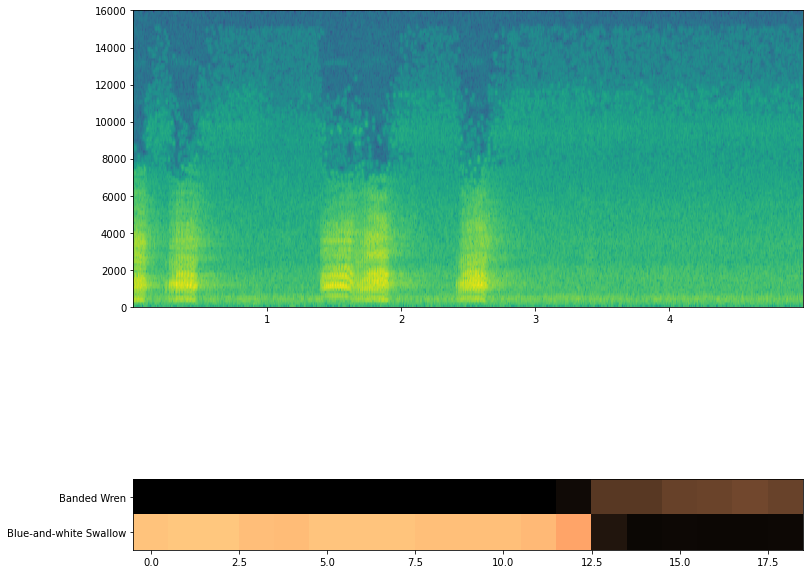

batch idx= 1 class: Chestnut-capped Brushfinch
Clipwise Prediction Info
[0.31524456 0.25674668 0.15084589 0.04145892 0.03808082]
[119 270 178  99 136]
['Crimson-fronted Parakeet', 'Red-tailed Hawk', 'House Finch', 'Clay-colored Thrush', 'Flame-rumped Tanager']


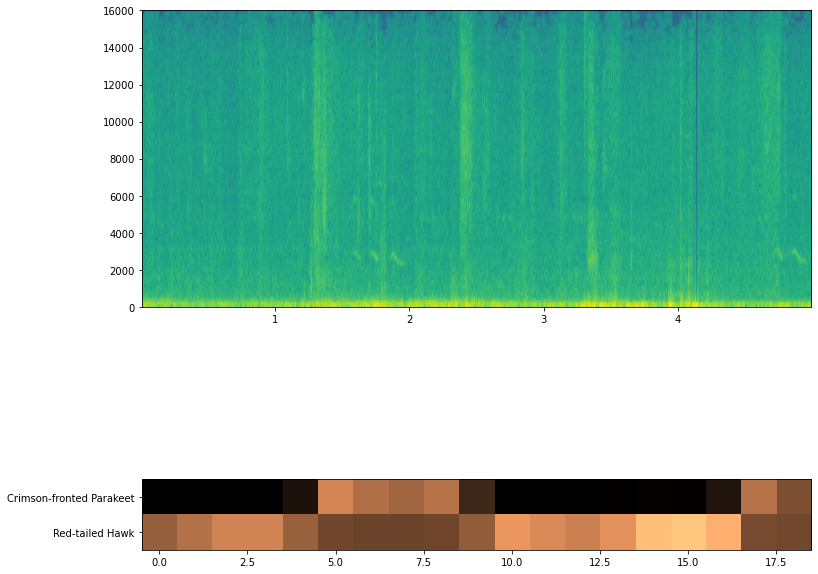

batch idx= 2 class: Orange-billed Nightingale-Thrush
Clipwise Prediction Info
[0.45249066 0.25571615 0.04830928 0.00679189 0.00617879]
[134 270   4 131 273]
['Ferruginous Pygmy-Owl', 'Red-tailed Hawk', 'American Crow', 'Elegant Trogon', 'Ringed Kingfisher']


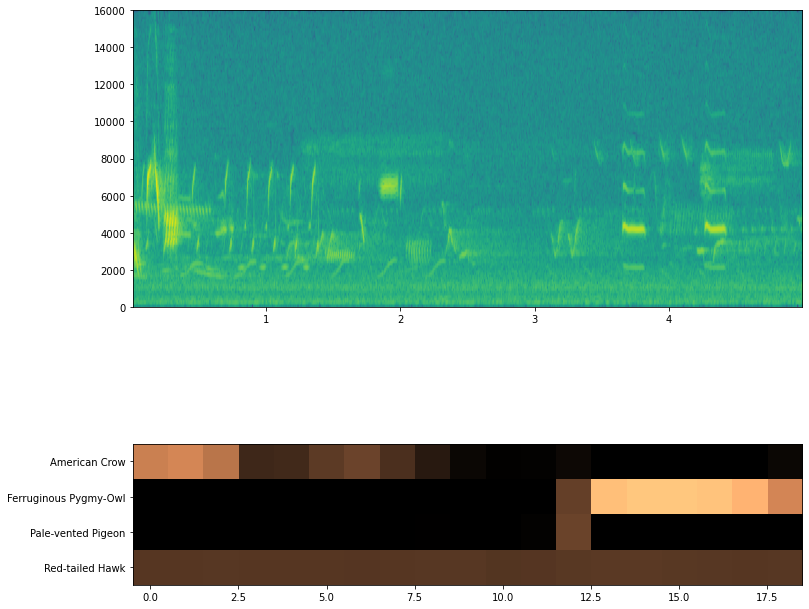

batch idx= 3 class: Gray-breasted Wood-Wren
Clipwise Prediction Info
[0.36843783 0.2542602  0.1776689  0.14296335 0.07332414]
[203 270 266  43 247]
['Long-tailed Manakin', 'Red-tailed Hawk', 'Red-eyed Vireo', 'Black-capped Tanager', 'Pied-billed Grebe']


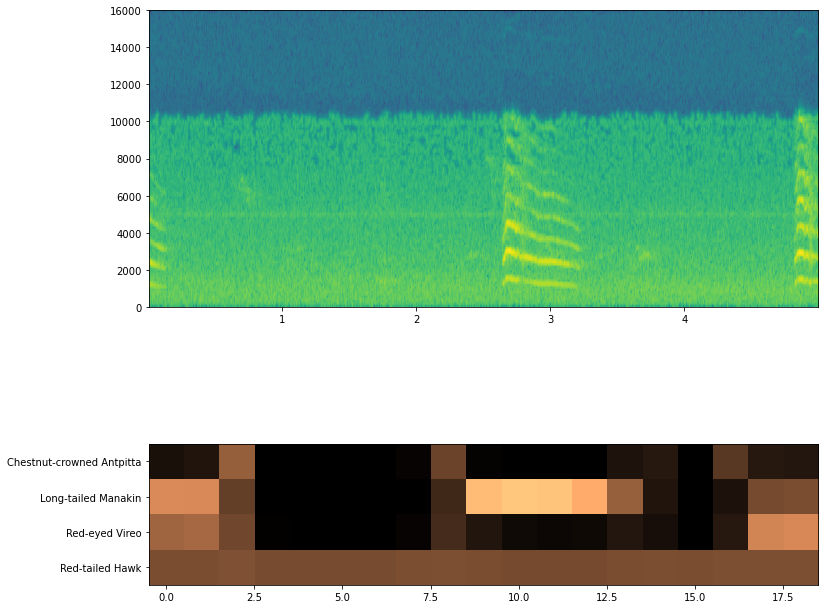

batch idx= 4 class: Rufous-capped Warbler
Clipwise Prediction Info
[0.25139588 0.06099958 0.05407928 0.04387606 0.04291472]
[270 252 121  69 298]
['Red-tailed Hawk', 'Plain Xenops', 'Dark-eyed Junco', 'Blue-gray Tanager', 'Sanderling']


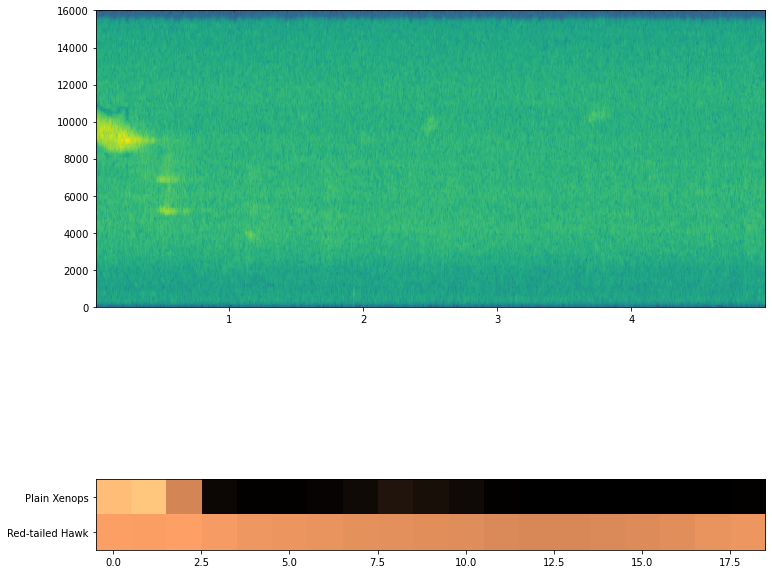

batch idx= 5 class: Blue-black Grassquit
Clipwise Prediction Info
[0.5160974  0.259042   0.05087747 0.03694174 0.03680449]
[102 270 111 143 211]
['Cocoa Woodcreeper', 'Red-tailed Hawk', 'Common Potoo', 'Golden-crowned Warbler', 'Melodious Blackbird']


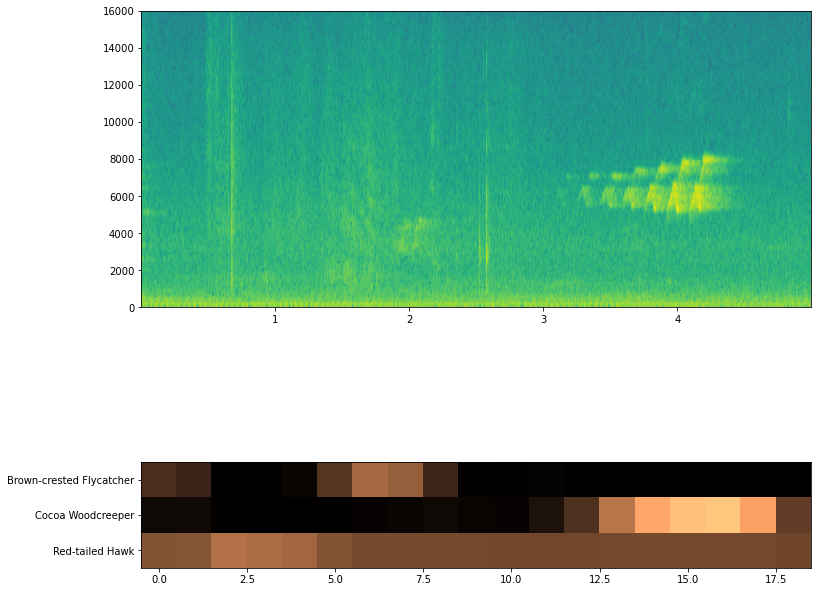

batch idx= 6 class: White-throated Sparrow
Clipwise Prediction Info
[0.3542757  0.26521164 0.12370157 0.10700709 0.05723399]
[ 21 270 181   7 403]
['Banded Wren', 'Red-tailed Hawk', "Hutton's Vireo", 'American Pipit', 'Western Chorus Frog']


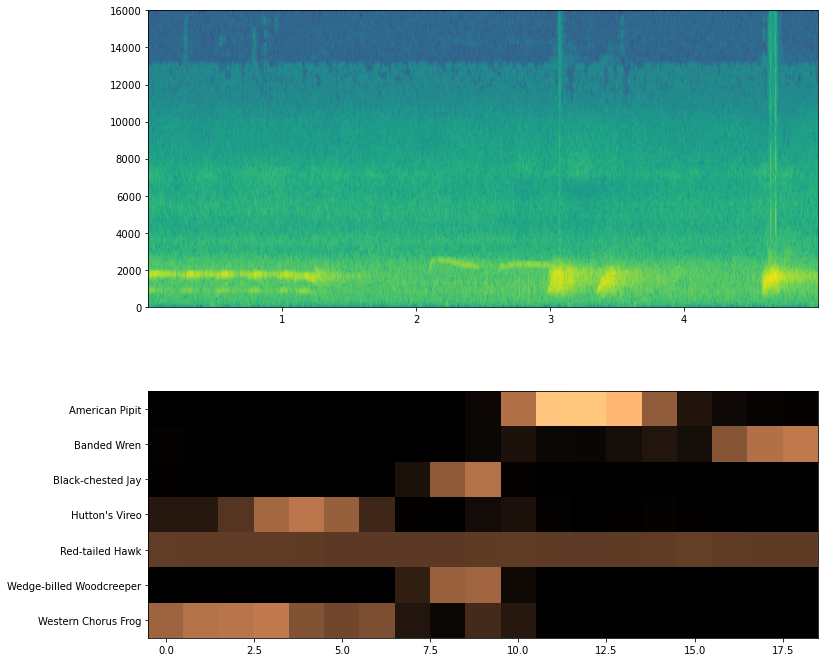

batch idx= 7 class: Saffron Finch
Clipwise Prediction Info
[0.6943501  0.25073993 0.16901754 0.05380429 0.0521646 ]
[129 270   6 285 295]
['Eastern Towhee', 'Red-tailed Hawk', 'American Kestrel', 'Ruby-crowned Kinglet', 'Rufous-tailed Jacamar']


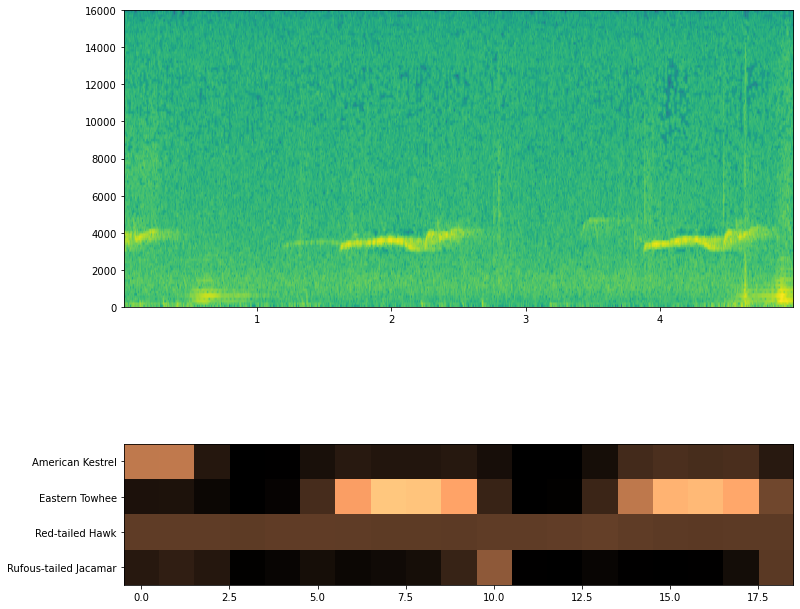

batch idx= 8 class: Baltimore Oriole
Clipwise Prediction Info
[0.250859   0.24503371 0.18800709 0.14832672 0.12772875]
[270 370 383  40 107]
['Red-tailed Hawk', 'White-throated Sparrow', 'Yellow-bellied Elaenia', 'Blue-black Grassquit', 'Common Grackle']


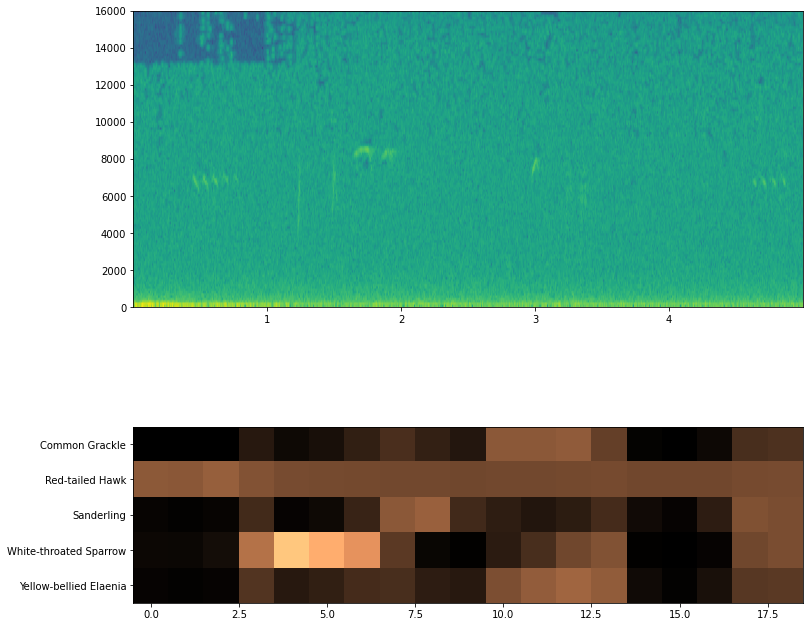

batch idx= 9 class: Great Blue Heron
Clipwise Prediction Info
[0.24991864 0.18859352 0.17924255 0.10030508 0.09531301]
[270 162 355 240 229]
['Red-tailed Hawk', 'Greater Yellowlegs', 'Western Bluebird', 'Ovenbird', 'Oak Titmouse']


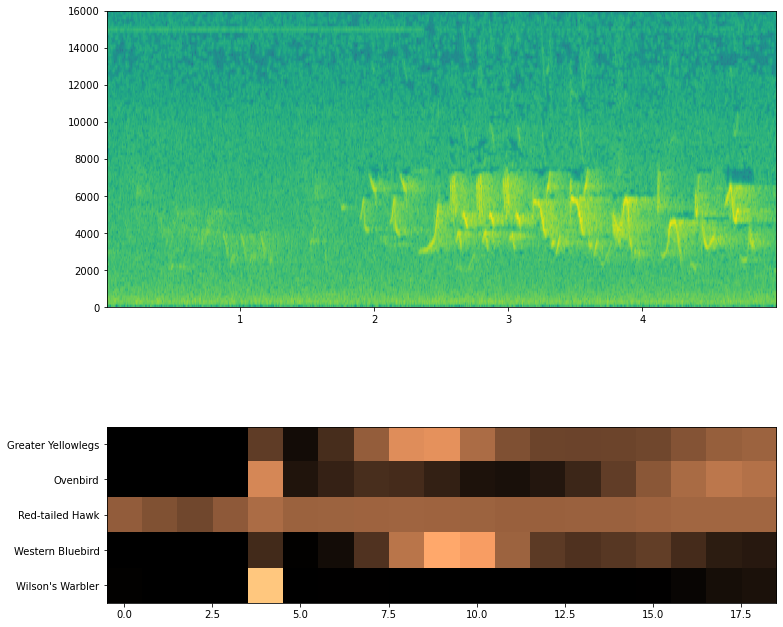

batch idx= 10 class: Ruddy Pigeon
Clipwise Prediction Info
[0.9505947  0.31356502 0.01423695 0.01192518 0.00767952]
[ 59 270 350 288  90]
['Brown Jay', 'Red-tailed Hawk', 'Warbling Vireo', 'Russet-crowned Warbler', 'Cedar Waxwing']


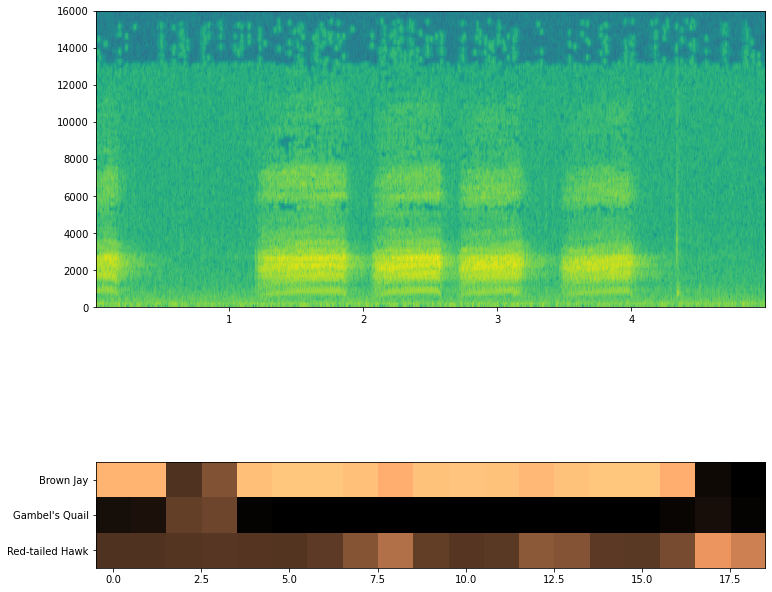

batch idx= 11 class: Yellow-bellied Seedeater
Clipwise Prediction Info
[0.31542528 0.25294054 0.04297534 0.03730056 0.03291116]
[121 270  91  62 135]
['Dark-eyed Junco', 'Red-tailed Hawk', 'Chestnut-backed Antbird', 'Broad-winged Hawk', 'Field Sparrow']


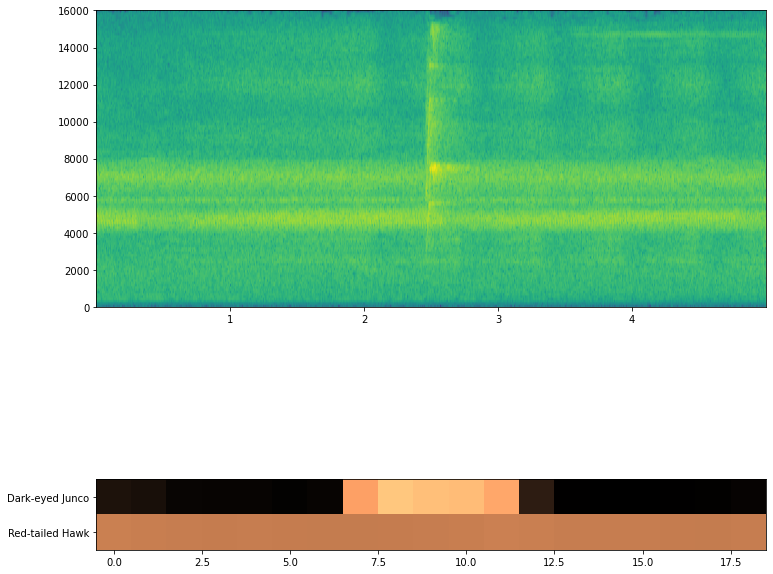

batch idx= 12 class: Rufous-backed Robin
Clipwise Prediction Info
[0.8774302  0.25737262 0.01233489 0.00362209 0.00137384]
[336 270  49 123 146]
['Thick-billed Kingbird', 'Red-tailed Hawk', 'Brown-crested Flycatcher', 'Dusky-capped Flycatcher', 'Green-winged Teal']


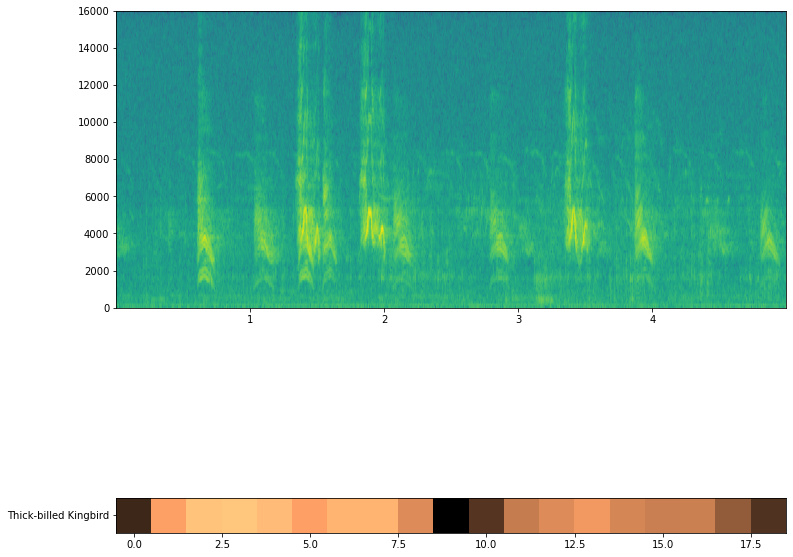

batch idx= 13 class: Song Sparrow
Clipwise Prediction Info
[0.88663995 0.25156683 0.06856766 0.05133823 0.03597774]
[119 270 342  77 146]
['Crimson-fronted Parakeet', 'Red-tailed Hawk', 'Tropical Mockingbird', 'Cactus Wren', 'Green-winged Teal']


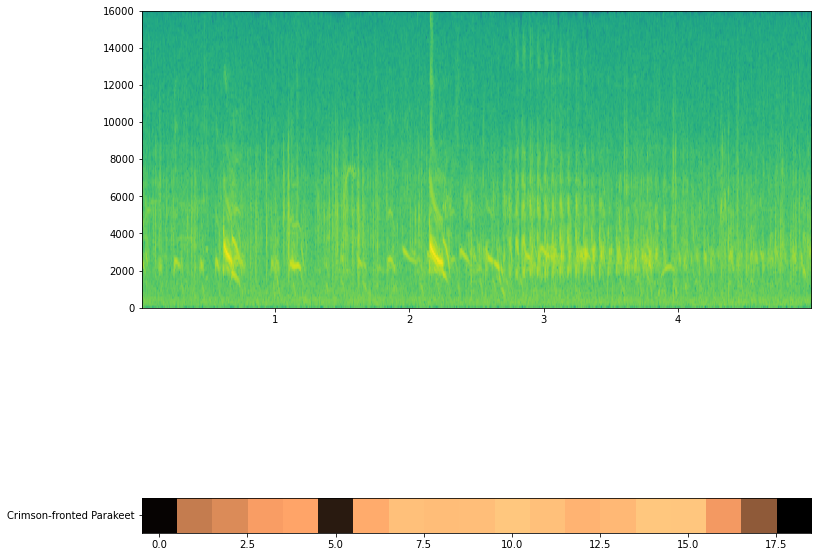

batch idx= 14 class: MacGillivray's Warbler
Clipwise Prediction Info
[0.26074606 0.16909266 0.13248466 0.062127   0.06092632]
[270 292  17 400 225]
['Red-tailed Hawk', 'Ruddy Ground Dove', 'Bald Eagle', 'Coyote', 'Northern Shoveler']


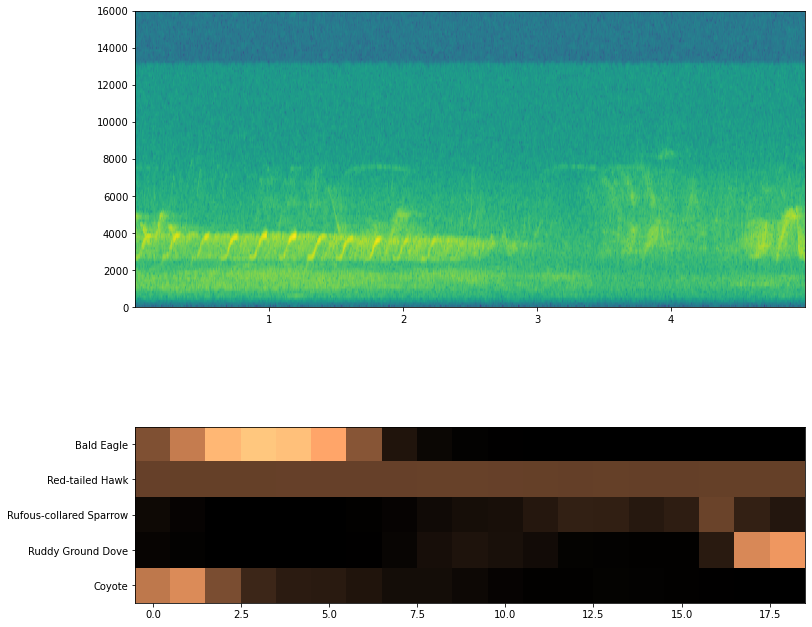

batch idx= 15 class: Lesser Goldfinch
Clipwise Prediction Info
[9.9871409e-01 1.4626079e-03 4.9358327e-04 3.8588108e-04 3.7862890e-04]
[270 184  58  61 105]
['Red-tailed Hawk', 'Keel-billed Toucan', 'Brown Creeper', 'Bright-rumped Attila', 'Collared Trogon']


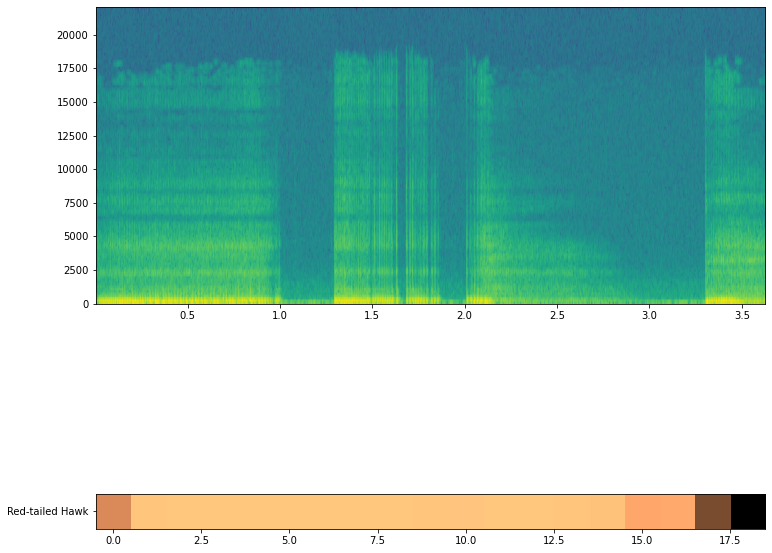

In [68]:
for idx in range(0,16):
    top_k_clip = output['clipwise_output'][idx].topk(5)

    print("batch idx=",idx, "class:",bird_common(y[idx].item()))

    print("Clipwise Prediction Info")
    print(top_k_clip.values.cpu().detach().numpy())
    print(top_k_clip.indices.cpu().numpy())
    print(list(map(bird_common,top_k_clip.indices.cpu().numpy())))


    plot_pred(batch, output, idx,label_fn=bird_common)


In [114]:
keys.to_csv(result_path/'keys.csv')

In [115]:
df.to_csv(result_path/'df.csv')

In [13]:
keys = pd.read_csv(result_path/'keys.csv')
df = pd.read_csv(result_path/'df.csv')

/media/SSD/conda_env/fastaiv2/lib/python3.9/site-packages/IPython/core/interactiveshell.py:3169: DtypeWarning: Columns (1,2,5,6,10,16,19,21,22,23) have mixed types.Specify dtype option on import or set low_memory=False.
  has_raised = await self.run_ast_nodes(code_ast.body, cell_name,


In [34]:
primary_labelsa = set(df.primary_label.unique())

In [37]:
set(primary_labels)

{'acafly',
 'acowoo',
 'aldfly',
 'ameavo',
 'amecro',
 'amegfi',
 'amekes',
 'amepip',
 'amered',
 'amerob',
 'amewig',
 'amtoad',
 'amtspa',
 'andsol1',
 'annhum',
 'astfly',
 'azaspi1',
 'babwar',
 'baleag',
 'balori',
 'banana',
 'banswa',
 'banwre1',
 'barant1',
 'barswa',
 'batpig1',
 'bawswa1',
 'bawwar',
 'baywre1',
 'bbwduc',
 'bcnher',
 'belkin1',
 'belvir',
 'bewwre',
 'bkbmag1',
 'bkbplo',
 'bkbwar',
 'bkcchi',
 'bkhgro',
 'bkmtou1',
 'bknsti',
 'blbgra1',
 'blbthr1',
 'blcjay1',
 'blctan1',
 'blhpar1',
 'blkpho',
 'blsspa1',
 'blugrb1',
 'blujay',
 'bncfly',
 'bnhcow',
 'bobfly1',
 'bongul',
 'botgra',
 'brbmot1',
 'brbsol1',
 'brcvir1',
 'brebla',
 'brncre',
 'brnjay',
 'brnthr',
 'brratt1',
 'brwhaw',
 'brwpar1',
 'btbwar',
 'btnwar',
 'btywar',
 'bucmot2',
 'buggna',
 'bugtan',
 'buhvir',
 'bulori',
 'burwar1',
 'bushti',
 'butsal1',
 'buwtea',
 'cacgoo1',
 'cacwre',
 'calqua',
 'caltow',
 'cangoo',
 'canwar',
 'carchi',
 'carwre',
 'casfin',
 'caskin',
 'caster1',
 'ca

In [36]:
primary_labelsa

{'acafly',
 'acowoo',
 'aldfly',
 'ameavo',
 'amecro',
 'amegfi',
 'amekes',
 'amepip',
 'amered',
 'amerob',
 'amewig',
 'amtoad',
 'amtspa',
 'andsol1',
 'annhum',
 'astfly',
 'azaspi1',
 'babwar',
 'baleag',
 'balori',
 'banana',
 'banswa',
 'banwre1',
 'barant1',
 'barswa',
 'batpig1',
 'bawswa1',
 'bawwar',
 'baywre1',
 'bbwduc',
 'bcnher',
 'belkin1',
 'belvir',
 'bewwre',
 'bkbmag1',
 'bkbplo',
 'bkbwar',
 'bkcchi',
 'bkhgro',
 'bkmtou1',
 'bknsti',
 'blbgra1',
 'blbthr1',
 'blcjay1',
 'blctan1',
 'blhpar1',
 'blkpho',
 'blsspa1',
 'blugrb1',
 'blujay',
 'bncfly',
 'bnhcow',
 'bobfly1',
 'bongul',
 'botgra',
 'brbmot1',
 'brbsol1',
 'brcvir1',
 'brebla',
 'brncre',
 'brnjay',
 'brnthr',
 'brratt1',
 'brwhaw',
 'brwpar1',
 'btbwar',
 'btnwar',
 'btywar',
 'bucmot2',
 'buggna',
 'bugtan',
 'buhvir',
 'bulori',
 'burwar1',
 'bushti',
 'butsal1',
 'buwtea',
 'cacgoo1',
 'cacwre',
 'calqua',
 'caltow',
 'cangoo',
 'canwar',
 'carchi',
 'carwre',
 'casfin',
 'caskin',
 'caster1',
 'ca

In [38]:
len(primary_labelsa)

405

In [39]:
len(primary_labels)

405